<a href="https://colab.research.google.com/github/toshikis/AISeminar/blob/%E5%BE%A9%E7%BF%92%E7%94%A8%E6%95%99%E6%9D%90/%E6%A9%9F%E6%A2%B0%E5%AD%A6%E7%BF%92%E5%9F%BA%E7%A4%8E%E2%91%A1%E6%95%99%E5%B8%AB%E3%81%82%E3%82%8A%E5%AD%A6%E7%BF%92_%E8%AC%9B%E5%B8%AB%E7%94%A8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

このパートで必要になるライブラリを一括してインポートしておきましょう。

In [1]:
!pip install japanize-matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.1/4.1 MB 35.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for japanize-matplotlib: filename=japanize_matplotlib-1.1.3-py3-none-any.whl size=4120257 sha256=1fd487764c6729593c27b6db2d2be040406c0173ae2cf3a555cbcc5850d89484
  Stored in directory: /root/.cache/pip/wheels/61/7a/6b/df1f79be9c59862525070e157e62b08eab8ece27c1b68fbb94
Successfully built japanize-matplotlib


In [ ]:
#データ分析ライブラリ
import numpy as np
import numpy.random as random
import scipy as sp
import pandas as pd
from pandas import Series,DataFrame

#可視化ライブラリ
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib import cm
import japanize_matplotlib
import seaborn as sns
%matplotlib inline

#機械学習ライブラリ
import sklearn
from sklearn import datasets
from sklearn import linear_model
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

#小数第2位まで表示
%precision 2

#データフレームが全列表示されるように設定
pd.set_option('display.max_columns', None)

# <font color=#0e89b2>1. 教師あり学習とは</font>

## <font color=#0e89b2>1.1 教師あり学習と教師なし学習</font>

AI概論の復習にはなりますが、おさらいしておきます。

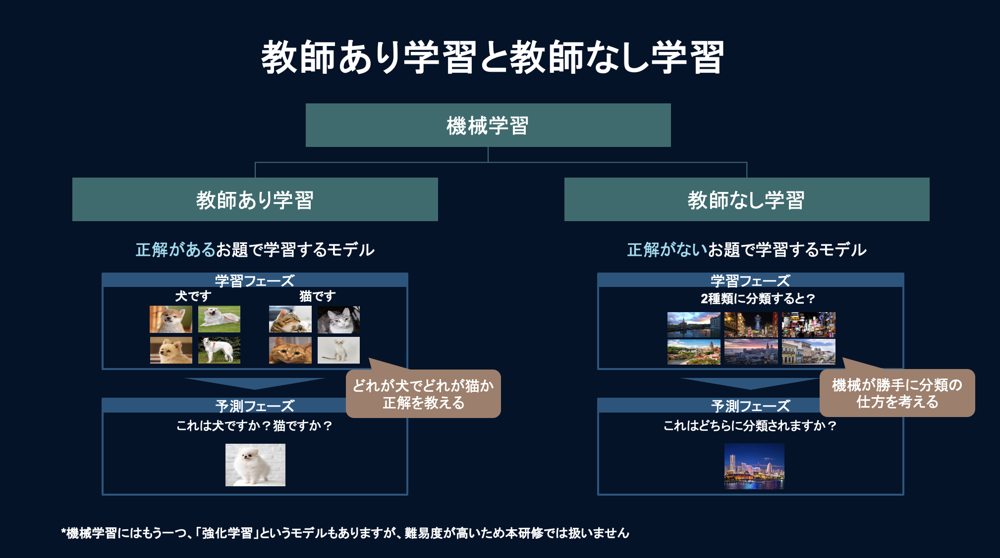



---


*   <font color=#f27405>教師あり学習</font>：
 * 正解があるお題で学習するモデル
 * 使用例：家賃予測（家賃という正解数値を与える）、犬と猫の画像判別（犬/猫という正解ラベルを与える）
*   <font color=#f27405>教師なし学習</font>：
 * 正解がないお題で学習するモデル
 * モデルが自分でパターンや傾向を見出す
 * 使用例：顧客属性のクラスタリング、犬と猫の画像判別（犬/猫という正解ラベルを与えない）


---



ここでの注意点としては、例えば同じ「犬猫画像判別モデル」であっても、<br>
学習データとして「この画像は犬」「この画像は猫」と正解ラベルを与えていたら「教師あり学習」になるし、<br>
逆に、犬猫の正解ラベルをつけることなく、ただ画像だけをどさっと与えたら「教師なし学習」になるということです。<br>
<br>
このあたりは抽象的に説明されてもあまりピンとこないとは思いますが、<br>
今後色々な実例を見たり実装したりすることで、どんどん解像度が高まっていくはずです。

## <font color=#0e89b2>1.2 回帰と分類</font>

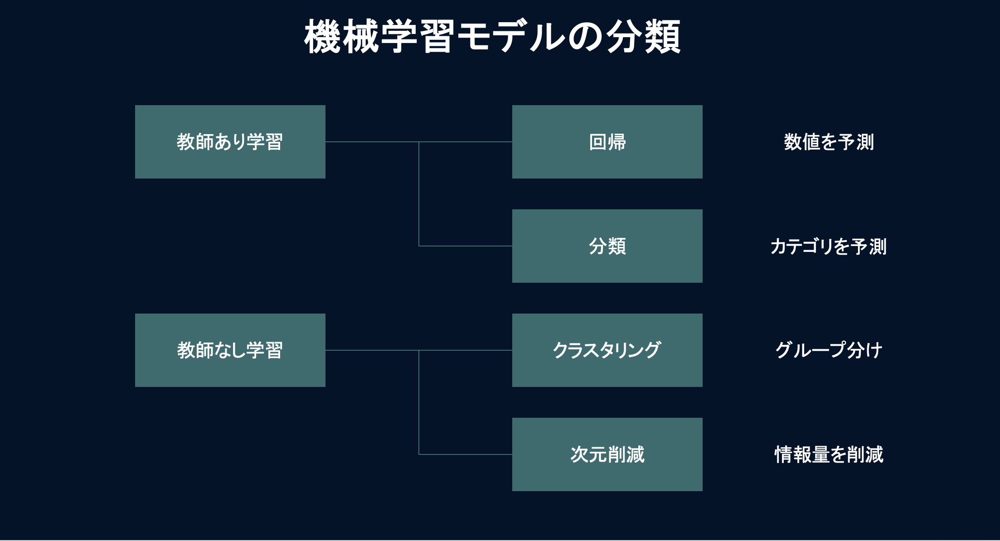

教師あり学習は、目的変数のデータの形式によって、<font color=#f27405>回帰</font>と<font color=#f27405>分類</font>の2種類に分かれます。<br>
<br>



---



*   回帰：目的変数が売上、株価、クリック率、身長などの<font color=#f27405>数値</font>を取る場合
 * 例)平米数や築年数から、家賃を予測する
*   分類：目的変数が性別、合否、犬or猫、正常orスパムなどの<font color=#f27405>カテゴリ</font>を取る場合
 * 例）顧客の属性情報から、その顧客が商品を買うか買わないかを予測する




---



## <font color=#0e89b2>1.3 教師あり学習の色々なアルゴリズム</font>

教師あり学習は、以下のようなアルゴリズムを使用して実装することができます。

---
*   単回帰
*   重回帰
*   決定木
*   ランダムフォレスト
*   サポートベクトルマシン
*   k近傍法

---





ただ実はscikit learnではありがたいことに、<br>
<font color=#f27405>アルゴリズムが変わっても実装方法は基本的には変わりません</font>。<br>
<br>
以下、各アルゴリズムについて、特徴や大まかな仕組みについても触れながら、実際に実装していきます。

# <font color=#0e89b2>2. 回帰モデルの実装</font>

## <font color=#0e89b2>2.1 単回帰</font>

### <font color=#0e89b2>1)単回帰とは</font>

まずは一番初歩的な、単回帰モデルから実装していきましょう。
<br>
単回帰は、<font color=#f27405>1つの説明変数（要因）から目的変数（結果）を予測する</font>手法です。<br>
<br>
と言ってもピンと来ないと思いますが、例を挙げると分かりやすいと思います。<br>
<br>


◆単回帰分析の例

---


*   <font color=#f27405>身長</font>（説明変数）から<font color=#f27405>体重</font>（目的変数）を予測する
*   <font color=#f27405>平米数</font>（説明変数）から<font color=#f27405>家賃</font>（目的変数）を予測する
*   <font color=#f27405>従業員数</font>（説明変数）から<font color=#f27405>企業の売上</font>（目的変数）を予測する


---




### <font color=#0e89b2>2)単回帰の仕組み</font>

単回帰では、最小二乗法という数学を使っています。<br>
こちらの図を見るとイメージが湧くでしょうか。
<br>
ちなみにこれから色々な機械学習モデルが登場しますが、どれも同様につまるところは数学です。

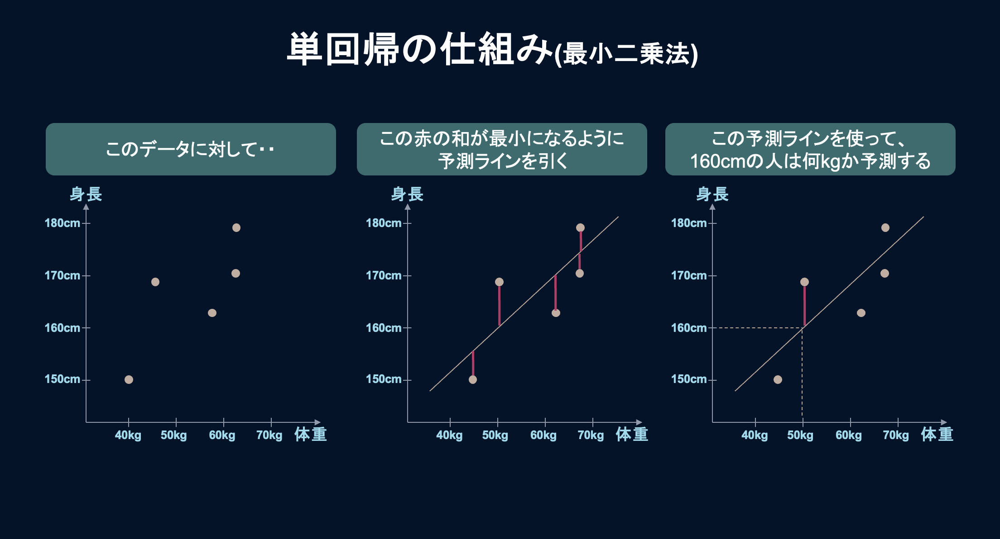

### <font color=#0e89b2>3)単回帰モデルの実装</font>

実際に簡単な単回帰分析モデルを実装してみましょう。<br>
上の図と同じく、身長から体重を予測するモデルを実装してみます。<br>

In [ ]:
#身長と体重のデータ
height = [[148], [149], [150], [152],[153], [154], [158],[160], [162], [164], [168], [174], [176], [178], [182], [184], [186]]
weight = [[42], [39], [40],[50], [45], [56], [58], [53], [47], [56], [58],[66],[60],[82],[78],[80], [76]]

先ほど学んだ<font color=#f27405>機械学習基本の4ステップ</font>を覚えているでしょうか。<br>
思い出しながら実装してみましょう！

In [ ]:
#####写経#####
#ステップ1：モデルの構築
from sklearn import linear_model #さっきもインポートしていますが一応再掲
model = linear_model.LinearRegression()

In [ ]:
#####写経#####
#ステップ2：学習
model.fit(height,weight)

LinearRegression()

In [ ]:
#####写経#####
#ステップ3：予測
model.predict([[168]]) #自分の身長を入力

array([[61.38]])

ステップ4の評価フェーズは省略しますが、そこそこ違和感のない予測体重が出力されたのではないでしょうか？

### <font color=#0e89b2>4)学習データとテストデータの分割</font>

前のパートでは、そこそこ妥当な予測体重が算出されることは分かったものの、<br>
どれくらいの精度なのかを定量的に評価することは出来ません。<br>
<br>
評価するためには、

*   1)<font color=#f27405>評価用のデータを一定数準備すること</font>
*   2)<font color=#f27405>評価の指標を決めること</font>

が必要そうです。<br>
<br>
まずは1)から説明していきます。<br>
評価用のデータを準備するためには、予めデータを<font color=#f27405>学習データとテストデータに分割</font>しておきましょう。<br>
ここでは、学習データとテストデータの分割のやり方を学びます。<br>
<br>
scikit learnは至れり尽くせりなので、データ分割のための便利なメソッドが準備されています。<br>
<br>
先ほどの身長・体重データを、学習データとテストデータに分割してみましょう。

In [ ]:
#####写経#####
#ライブラリのインポート
from sklearn.model_selection import train_test_split #先ほどもインポートしていますが一応再掲

#学習データとテストデータの分割
x_train, x_test, y_train, y_test = train_test_split(height, weight, test_size=0.3, random_state=0) #random_stateは乱数発生で出てきたseedと同じ意味です

In [ ]:
#####写経#####
x_train

[[150], [182], [168], [160], [186], [174], [152], [148], [154], [184], [176]]

In [ ]:
#####写経#####
y_train

[[40], [78], [58], [53], [76], [66], [50], [42], [56], [80], [60]]

### <font color=#0e89b2>5)回帰モデルの評価</font>

回帰モデルの評価指標には、下記のようなものがあります。


---



*   <font color=#f27405>決定係数</font>：
 * 予測誤差を正規化して得られる指標
 * 目安：1に近いほどモデルの精度が良く、0近いと悪い。あまりに悪いとマイナスになる
*   <font color=#f27405>平均絶対誤差（MAE）</font>：
 * 予測誤差の絶対値を平均して得られる指標
 * 大きな誤差も小さな誤差も平等に評価したい場合に使用
 * 小さいほど精度が高い
*   <font color=#f27405>二乗平均平方根誤差（RMSE)</font>：
 * 予測誤差の二乗を平均して得られる指標
 * 大きな誤差に対して厳しく評価したい場合に使用
 * 小さいほど精度が高い



---
今回は分かりやすい決定係数を使いましょう！<br>
<br>
改めてモデルを構築して、評価してみます。



In [ ]:
#ライブラリのインポート
from sklearn.metrics import r2_score

In [ ]:
#####写経#####
#ステップ1：モデルの構築
model = linear_model.LinearRegression()

#ステップ２：学習（先ほど分割した「学習データ」の方のみを使って学習させています）
model.fit(x_train, y_train)

#ステップ3：予測（先ほど分割した「テストデータ」の方のみを予測させています）
pred = model.predict(x_test)

#ステップ4：評価
r2_score(y_test, pred)

0.752463373160196

In [ ]:
#####写経#####
#ちなみにステップ3とステップ4をまとめて1行で書くことも出来ます
model.score(x_test, y_test)

0.752463373160196

決定係数0.75なので、まずまずの精度が出ているようです。<br>
<br>
「身長から体重を予測する」程度の単純な問題であれば、単回帰でもある程度精度は出るようですね。<br>
ただし、例えば背が高くても、痩せ型で体重が軽い人もいるように、精度向上に限界はありそうです。<br>
<br>
ちなみに<font color=#f27405>回帰直線</font>を図示すると、このようになります。

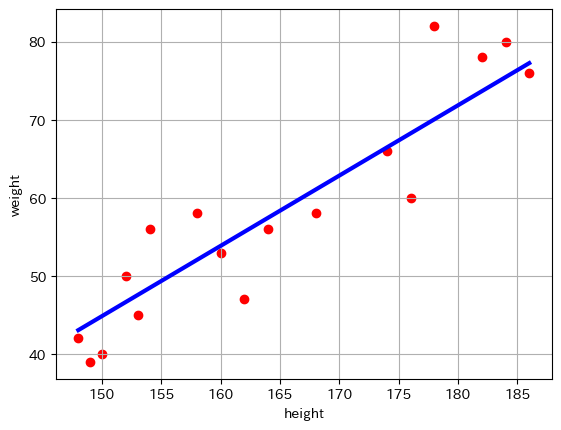

In [ ]:
#####写経#####
#身長と体重の分布を赤色で描画
plt.scatter(height, weight,  color='red')

#回帰直線を青色で表示
plt.plot(height, model.predict(height), color='blue', linewidth=3)

#その他グラフの情報の表示
plt.xlabel("height")
plt.ylabel("weight")
plt.grid(True)

plt.show()

### <font color=#0e89b2>練習問題1: BMIから糖尿病の進行度合いを予測する</font>

#### <font color=#0e89b2>はじめに</font>

<font color=#f27405>医療</font>分野では、機械学習の活用が進んでいます。<br>
今回は、医療×機械学習の超初級版として、<font color=#f27405>BMIから糖尿病の進行度合いを予測</font>するモデルを作ってみましょう。<br>

#### <font color=#0e89b2>データの確認</font>

In [ ]:
#データの読み込み
diabetes = datasets.load_diabetes()
# 目的変数
exp_data = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)
# 説明変数
tar_data = pd.DataFrame(diabetes.target, columns=['target'])
# データを結合
df = pd.concat([exp_data, tar_data], axis=1)
#データをPandasのDataFrameオブジェクトに格納
df.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641,135.0


ちなみに、各カラムの意味は以下の通りです。

---

age : 年齢

sex : 性別

bmi : ボディマス指数

bp  : 平均血圧

s1  : 総血清コレステロール

s2  : 低密度リポタンパク質

s3  : 高密度リポタンパク質

s4  : 総コレステロール量

s5  : 血清トリグリセリドレベルの対数

s6  : 血糖値

target : 糖尿病の進行度合い

---

また、target以外の各値は、処理しやすいように、正規化された値になっています。

#### <font color=#0e89b2>練習問題1-1：ヒートマップの作成</font>

各カラム同士の相関係数を示すヒートマップを作成し、<br>
「糖尿病の進行度合い」と最も相関度の高い変数を見つけてください。

In [ ]:
#PandasのDataframeのcorr()メソッドを使って、相関係数を算出


#Seabornのheatmap()メソッドを使って、相関係数をヒートマップで可視化
#2つ目以下の引数には、以下を指定しましょう。cmap="coolwarm", vmin=-1, vmax=1, annot=True


解答

<Axes: >

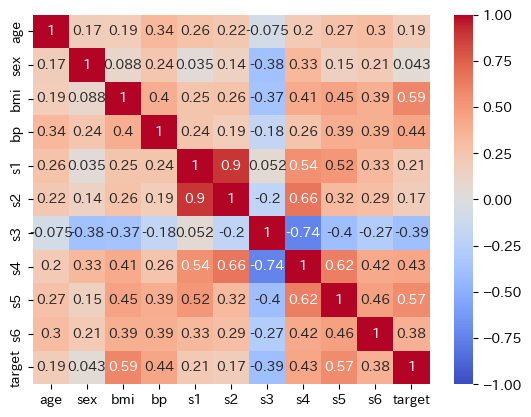

In [ ]:
#PandasのDataframeのcorr()メソッドを使って、相関係数を算出
corr = df.corr()

#Seabornのheatmap()メソッドを使って、相関係数をヒートマップで可視化
fig = plt.figure()
sns.heatmap(corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True)

#### <font color=#0e89b2>練習問題1-2：データの前処理</font>

上で準備したDataFrameから、BMIとtargetのカラムのみを取り出した新しいDataFrameを作ってください。<br>
新しいDataFrameは、df_BMIと名付けてください。

In [ ]:
#BMIのカラムのみを取り出した新しいDataFrameを作成


解答

In [ ]:
#BMIのカラムのみを取り出した新しいDataFrameを作成
df_BMI = df[["bmi","target"]]
df_BMI.head()

,bmi,target
0,0.061696,151.0
1,-0.051474,75.0
2,0.044451,141.0
3,-0.011595,206.0
4,-0.036385,135.0


#### <font color=#0e89b2>練習問題1-3：単回帰モデルの構築</font>

BMIを説明変数、target(糖尿病の進行度合い）を目的変数として、機械学習モデルを構築してください。<br>
機械学習基本の4ステップを思い出しながら実装しましょう。

In [ ]:
#ライブラリのインポート（ライブラリはノートブックの中で一度インポートすればOKですが、今回は練習のために再度インポートしてみましょう）


#学習データとテストデータに分割（テストデータの割合は5割、random_stateは0に設定してください）



In [ ]:
#ステップ１：モデルの構築

#ステップ２：学習

#ステップ3：予測（ステップ3と4は1行で書いても構いません）

#ステップ4：評価

ヒント： <br>
1D arrayエラーが出てきていないでしょうか？<br>
df_BMI["bmi"]を読み込ませると、1D arrayエラーが出てきてしまいます。<br>
2D arrayにするにはどうすればいいでしょうか？

解答

In [ ]:
#ライブラリのインポート（ライブラリはノートブックの中で一度インポートすればOKですが、今回は練習のために再度インポートしてみましょう）
from sklearn import linear_model
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

#説明変数と目的変数のセット
x = df_BMI[["bmi"]]
y = df_BMI[["target"]]

#学習データとテストデータに分割
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.5, random_state=0)

In [ ]:
#ステップ１：モデルの構築
model = linear_model.LinearRegression()

#ステップ２：学習
model.fit(x_train, y_train)

#ステップ3：予測
pred = model.predict(x_test)

#ステップ4：評価
r2_score(y_test, pred)

0.31689168124207745

In [ ]:
#ステップ3とステップ4は1行で書くことも可能
model.score(x_test, y_test)

0.31689168124207745

決定係数は0.32と、あまり精度が良くないことがわかります。<br>
やはり1変数のみから予測するには限界があるようです。<br>
<br>
そこで次のセクションで、予測に複数の変数を使用する重回帰モデルを実装して、精度向上を目指していきましょう。

## <font color=#0e89b2>2.2 重回帰</font>

### <font color=#0e89b2>1)重回帰とは</font>

<font color=#f27405>単回帰では1つの説明変数だけを使いましたが、複数の説明変数を用いる手法</font>を重回帰といいます。<br>
説明変数が増えるわけなので、その分基本的には単回帰よりもモデルの精度向上が見込めます。

### <font color=#0e89b2>2)重回帰の仕組み</font>

単回帰の応用で、仕組みとしては全く同じです。<br>
<br>
単回帰のときは、図のように、二次元での点(x,y)と線の距離を最小化していました。<br>
これを三次元(x,y,z)、四次元(w,x,y,z)で行なっていくのが重回帰です。<br>

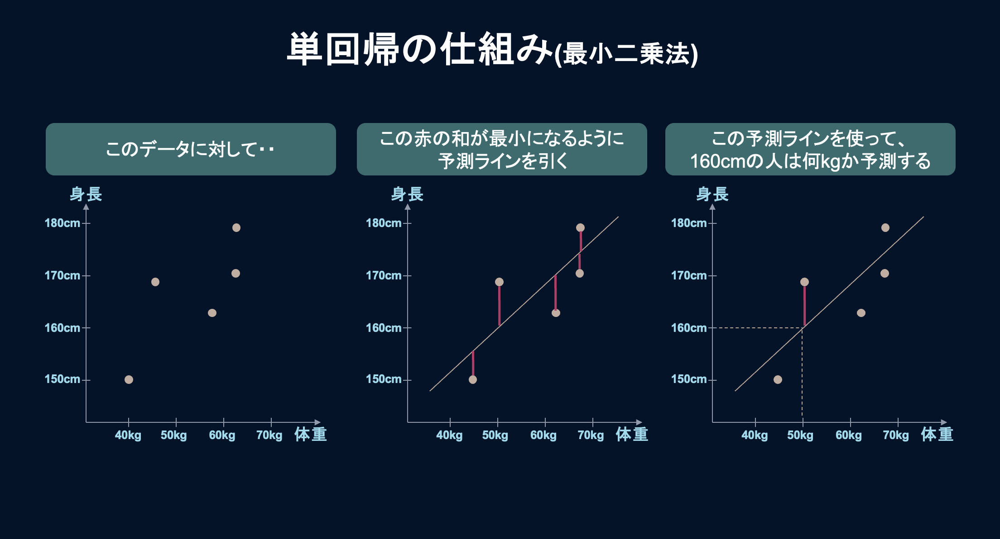

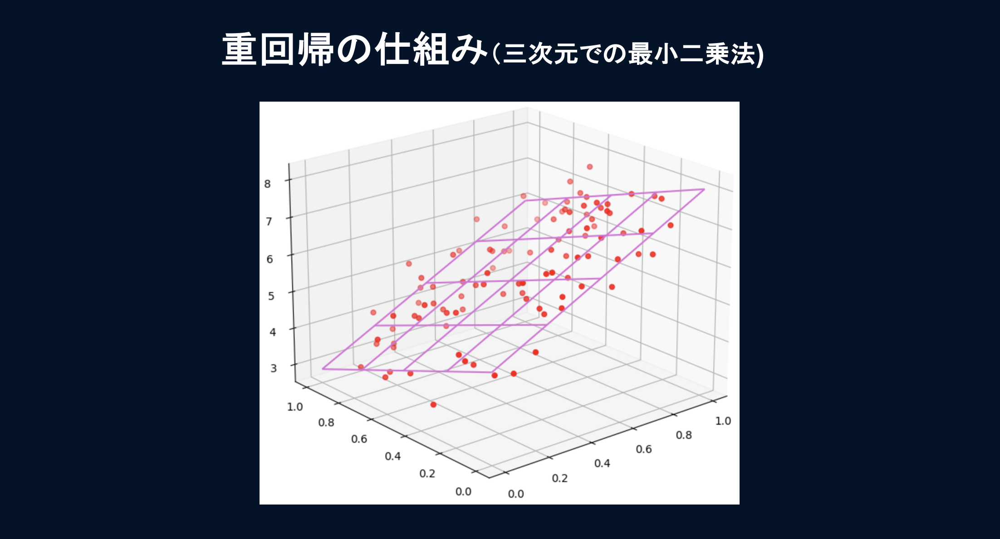

### <font color=#0e89b2>3)関連知識：多重共線性の解消</font>

#### <font color=#0e89b2>a. 多重共線性とは</font>

多重共線性とは、複数の説明変数間に高い相関関係がある場合に、回帰係数の推定値が不安定になり、重回帰分析モデル等の精度が低下してしまうことです。<br>
このリスクを回避するために、通常、重回帰のモデル構築では 相関の高い変数群からはどちらか片方のみを使用します。

#### <font color=#0e89b2>b. 多重共線性の目安</font>

概ね以下のような基準で判断されることが多いです。<br>


---
*   相関係数<font color=#f27405>0.95</font>以上：多重共線性強い。絶対削除した方が良い
*   相関係数<font color=#f27405>0.9</font>以上：多重共線性あり。削除した方がいいかも
*   相関係数<font color=#f27405>0.7</font>以上：やや多重共線性あり。厳しく見たら削除することもある
---






なお、<font color=#f27405>負の相関が強い場合も、多重共線性の問題は同様に起こります</font>。<br>
その場合は、上記の目安値にマイナスをつけて判断するようにしてください。

#### <font color=#0e89b2>c. 相関の確認</font>

練習問題1の糖尿病データを再び使って確認してみます。

In [ ]:
#データの読み込み
diabetes = datasets.load_diabetes()
# 目的変数
exp_data = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)
# 説明変数
tar_data = pd.DataFrame(diabetes.target, columns=['target'])
# データを結合
df_diabetes = pd.concat([exp_data, tar_data], axis=1)
#データをPandasのDataFrameオブジェクトに格納
df_diabetes.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641,135.0


このデータの各変数について、相関係数を確認してみます。<br>
（先ほどの練習問題1-1で実はやっているので、再掲です！）

<Axes: >

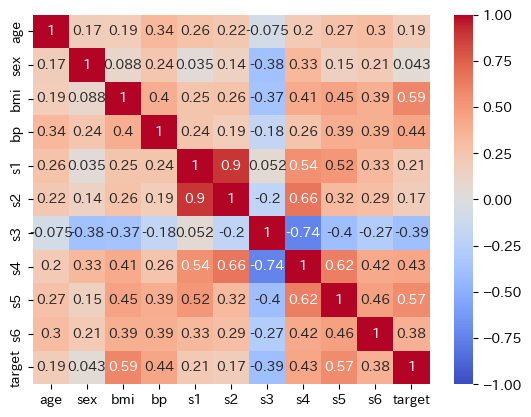

In [ ]:
#####写経#####
#PandasのDataframeのcorr()メソッドを使って、相関係数を算出
corr = df_diabetes.corr()

#Seabornのheatmap()メソッドを使って、相関係数をヒートマップで可視化
fig = plt.figure()
sns.heatmap(corr, cmap="coolwarm", vmin=-1, vmax=1, annot=True)

このヒートマップを見てみると、<font color=#f27405>s1とs2の相関が0.9と高くなっている</font>ので、s2の方をドロップ（削除）しておきましょう。<br>
<br>
次に、<font color=#f27405>s3とs4も-0.74と負の相関がそこそこ強い</font>ことがわかります。<br>
上の「目安」にもある通り、0.7以上の相関があるとドロップすることもありますが、今回は残しておきましょう。

#### <font color=#0e89b2>d. 変数のドロップ</font>

列の削除方法はPandasパートの復習になりますが、dropメソッドを使います。

In [ ]:
#####写経#####
df_diabetes_dropped = df_diabetes.drop("s2", axis=1)
df_diabetes_dropped.head()

,age,sex,bmi,bp,s1,s3,s4,s5,s6,target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.008142,-0.002592,-0.031988,-0.046641,135.0


### <font color=#0e89b2>4)モデルの実装〜評価</font>

In [ ]:
#####写経#####
#重回帰モデル構築のためのライブラリをインポート
from sklearn.linear_model import LinearRegression

#説明変数と目的変数をセット
x = df_diabetes_dropped.drop('target', axis=1)
y = df_diabetes_dropped['target']

#学習データとテストデータを分割
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.5, random_state=0)

#ステップ１：重回帰モデルの構築
model = LinearRegression()

#ステップ２：学習
model.fit(x_train,y_train)

#ステップ3-4：予測&評価
model.score(x_test,y_test)

0.4347826803223025

回帰モデルの評価指標について復習しておきます。

---



*   <font color=#f27405>決定係数</font>：
 * 予測誤差を正規化して得られる指標
 * 目安：<font color=#f27405>0.5</font>以上であれば比較的良い。（1に近いほどモデルの精度が良く、0近いと悪い。あまりに悪いとマイナスになる）
*   <font color=#f27405>平均絶対誤差（MSE）</font>：
 * 予測誤差の絶対値を平均して得られる指標
 * 大きな誤差も小さな誤差も平等に評価したい場合に使用
 * 目安：<font color=#f27405>0.1</font>以下であれば比較的良い
*   <font color=#f27405>二乗平均平方根誤差（RMSE)</font>：
 * 予測誤差の二乗を平均して得られる指標
 * 大きな誤差を出すサンプル（外れ値）に対して厳しく評価したい場合に使用
 * 目安：<font color=#f27405>0.3</font>以下であれば比較的良い



---

先ほどの単回帰モデルによる予測の時は決定係数が0.32、<br>
今回の重回帰モデルでは0.43と、精度は少し向上しています。<br>
<br>
目安として決定係数は、0.5以上であれば良いと評価されます。<br>
今回の0.43は0.5に達しておらず、そこまで高いスコアではないですが、まずまずの精度とはいえそうです。<br>

## <font color=#0e89b2>2.3 決定木回帰(回帰木)</font>

### <font color=#0e89b2>1)回帰木とは</font>

教師あり学習には<font color=#f27405>回帰</font>と<font color=#f27405>分類</font>があると学習しました。<br>
<br>
決定木は、分類で使われる方がメジャーかつ説明がわかりやすいので、まずは分類の方から説明していきます。<br>
ちなみに、分類で使われる決定木を分類木と呼びます。<br>
<br>
例えば気温と湿度から、人間の体感が「暑い」「涼しい」のいずれになるかを予測したいとします。<br>
<br>
まず、気温が25度未満であれば無条件に「涼しい」でしょう。（もしかしたら暑い人もいるかもしれませんが、ここでは無視)<br>
次に、気温が25度以上の場合ですが、湿度が低くてカラッとしていれば、意外と体感は涼しいものです。<br>
一方同じ25度以上でも、湿度が高ければ、蒸し蒸しと暑く感じるでしょう。<br>
<br>
このように、Yes/Noの条件分岐を作っていって分類を行なっていくのが分類木です。<br>
<br>
この考え方は、診断や心理テストなど色々な実生活で使われている考え方なので、誰でも理解しやすいアルゴリズムです。<br>
<font color=#f27405>わかりやすさ（説明のしやすさ）</font>が最大の特徴です。<br>
<br>
説明性が求められるビジネスの現場では、多少精度が低くなってもわかりやすさを重視して、決定木が採用されることも多いです。


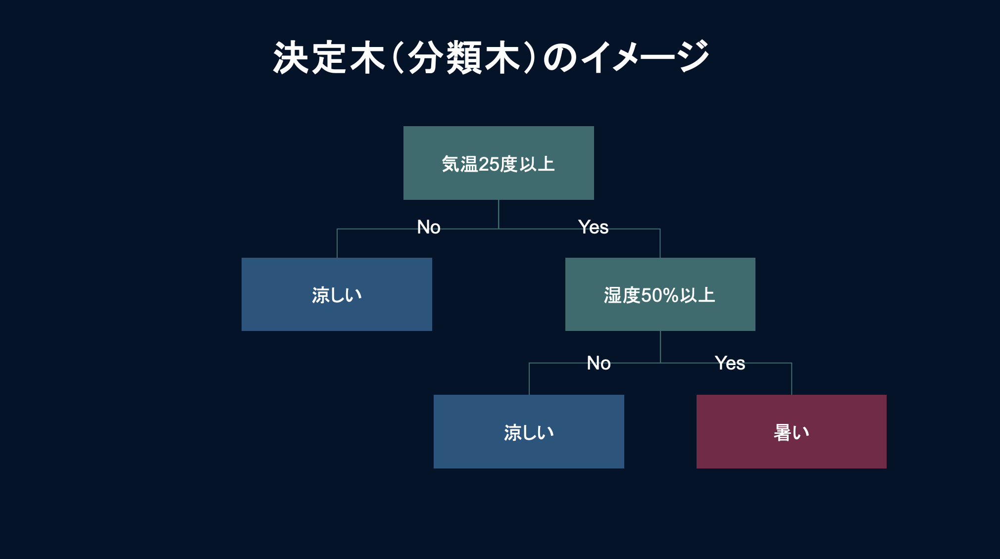

この考え方を応用して、決定木を回帰に用いることもできます。<br>
例えば上の気温と湿度の例で、今度は「体感温度」という数値を予測したいとしましょう。<br>
<br>
この場合は、先ほど「暑い」「涼しい」というカテゴリが入っていた枠を、<font color=#f27405>その区間の平均値</font>に置き換えれば回帰木になります。<br>
<br>
例えば今気温28度、湿度70%だとして、体感温度を予測したい場合は、<br>
右下の区画の平均体感温度を採用して、30度と予測します。<br>
（実際のモデルはもっと精緻に行うので、あくまで簡単なイメージです！）

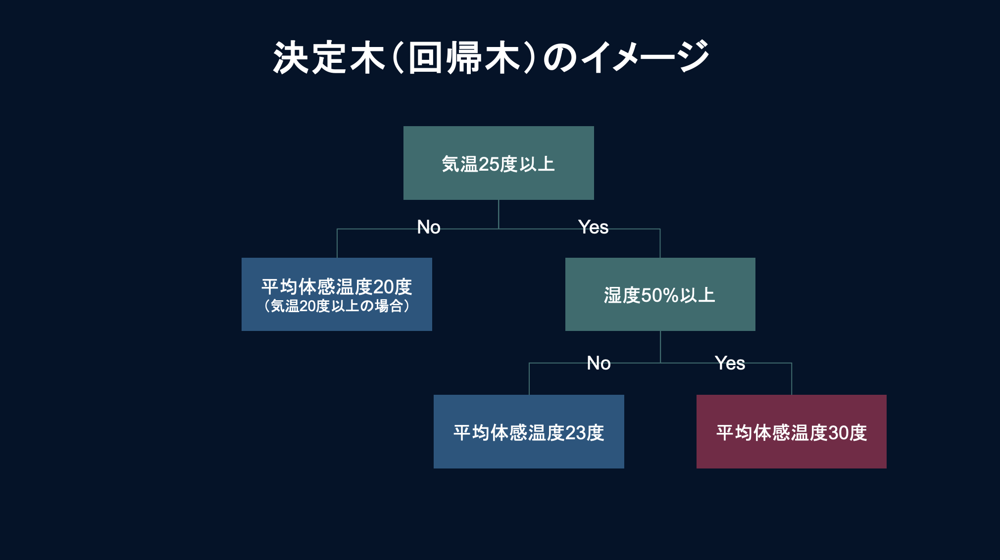

### <font color=#0e89b2>2)重回帰と回帰木の違い</font>

重回帰と回帰木では、得意とする場面が異なります。<br>
以下のような場面では、重回帰のような線形回帰が上手く当てはまらず、Yes/Noでパターン分けしていく回帰木の方がフィットします。<br>
<br>


---
*   ①<font color=#f27405>外れ値が多い</font>場合
 * 例）中古車の価格と年式の関係性：中古車の価格は基本的に年式が古くなるほど安くなりますが、中には希少価値の高い車種など、年式が古くても高値で取引される場合があります。このような外れ値が存在すると、線形回帰モデルは正確な価格を予測できなくなってしまいます。
*   ②<font color=#f27405>関係性が非線形</font>の場合
 * 例）部屋の広さと家賃の関係性：部屋の広さが広くなるほど基本的に家賃は高くなりますが、その関係性は線形ではなく、広さがある程度大きくなると家賃の上昇率は緩やかになります。
*   ③<font color=#f27405>説明変数間の相互作用がある</font>場合
 * 例）食生活・運動習慣・肥満率の関係性：肥満率は、食生活と運動習慣の両方の影響を受けますが、その影響は相互作用しています。例えば、運動習慣が少ない人は、食生活が多少悪くても肥満になりにくい一方、運動習慣が多い人は、食生活が悪ければ肥満になりやすいです。



---




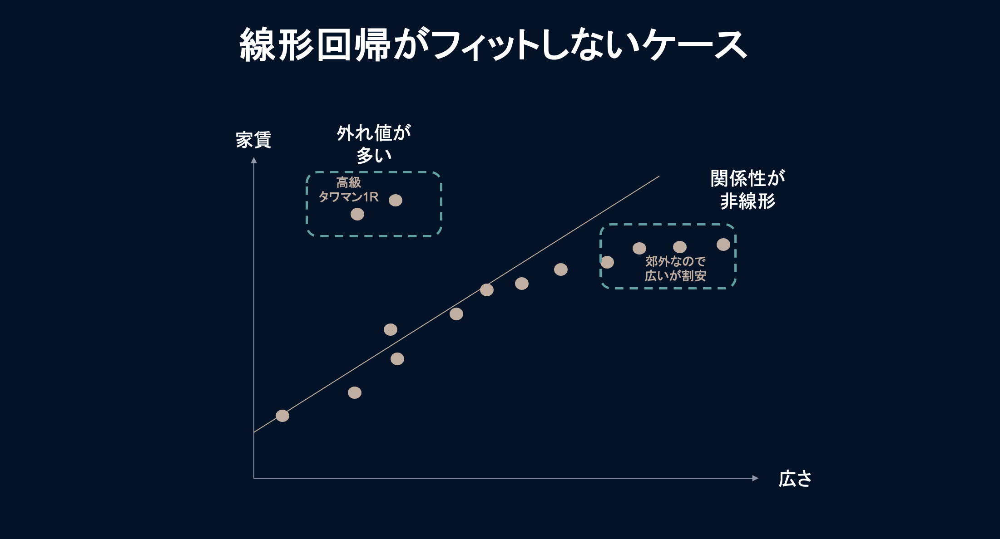

### <font color=#0e89b2>3)回帰木モデルの実装</font>

引き続き、糖尿病データを使ってモデルを実装していきます。<br>
念の為再度データを確認しておきます。

In [ ]:
df_diabetes.head()

,age,sex,bmi,bp,s1,s2,s3,s4,s5,s6,target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.034821,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,-0.019163,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.034194,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,0.024991,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.015596,0.008142,-0.002592,-0.031988,-0.046641,135.0


次に、これまでと同じ要領で、回帰木モデルを実装していきます。

In [ ]:
#####写経#####
#回帰木モデル構築のためのライブラリをインポート
from sklearn.tree import DecisionTreeRegressor

#説明変数と目的変数をセット
x = df_diabetes.drop('target', axis=1)
y = df_diabetes['target']

#学習データとテストデータを分割
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.5, random_state=0)

#ステップ１：重回帰モデルの構築
model = DecisionTreeRegressor(max_depth=6) #max_depthは決定木の分岐の深さの上限値

#ステップ２：学習
model.fit(x_train,y_train)

#ステップ3-4：予測&評価
model.score(x_test,y_test)

-0.11787573858006684

決定係数はマイナスと、かなり精度は悪くなってしまいました。<br>
今回の糖尿病データについては、回帰木よりも重回帰の方がフィットするようです。

### <font color=#0e89b2>練習問題2:家賃を予測する</font>

ここでは、カリフォルニアの住宅データを使って、家賃の予測モデルを作っていきます。<br>
まずはデータを確認していきます。

In [ ]:
#####写経#####
from sklearn.datasets import fetch_california_housing
housing_data = fetch_california_housing()
# 目的変数
exp_data = pd.DataFrame(housing_data.data, columns=housing_data.feature_names)
# 説明変数
tar_data = pd.DataFrame(housing_data.target, columns=['HousingPrices'])
# データを結合
housing_data = pd.concat([exp_data, tar_data], axis=1)

housing_data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,HousingPrices
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


各変数の意味は下記の通りです。<br>


---


* Medlnc：世帯所得の中央値
* HouseAge：住宅の築年数
* AveRooms：住宅の部屋数の平均
* AveBedrms：住宅の寝室数の平均
* Poplation：居住人数の合計
* AveOcuup：世帯人数の平均
* Latitude：各地区における代表地区の緯度
* HousePrices：各地区における代表地区の軽度


---



回帰木を用いて、"HousingPrices"を予測するモデルを作成して評価してください。

解答

In [ ]:
#####写経#####
#回帰木モデル構築のためのライブラリをインポート
from sklearn.tree import DecisionTreeRegressor

#説明変数と目的変数をセット
x = housing_data.drop('HousingPrices', axis=1)
y = housing_data['HousingPrices']

#学習データとテストデータを分割
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.5, random_state=0)

#ステップ１：重回帰モデルの構築
model = DecisionTreeRegressor(max_depth=6) #max_depthは決定木の分岐の深さの上限値

#ステップ２：学習
model.fit(x_train,y_train)

#ステップ3-4：予測&評価
model.score(x_test,y_test)

0.6271222530062992

決定係数は0.63と、なかなか高精度なモデルが作れました。<br>
次のセクションのランダムフォレストで、さらに高い精度を目指しましょう。

## <font color=#0e89b2>2.4 ランダムフォレスト回帰</font>

### <font color=#0e89b2>1)ランダムフォレストとは</font>

ランダムフォレストは、「フォレスト（森）」という名前の通り、複数の決定木を組み合わせる手法です。<br>
<font color=#f27405>複数の決定木を作ってそれぞれの木に予測を行わせ、最後に多数決を取って予測結果とする</font>ことで、精度を高めています。<br>
<br>
一つ一つの決定木の性能は必ずしも高くありませんが、それらを複数組み合わせることで汎化性能を高めているというわけです。<br>
<br>
ちなみに複数の決定木で多数決を取る際に、各決定木モデルが似たり寄ったりだと、多数決のメリットがないですよね。<br>
なので、<font color=#f27405>各決定木の予測結果ができるだけ異なるように工夫を加える必要</font>があります。<br>
具体的には、以下の2つの工夫を行なっています。<br>
<br>


*   <font color=#f27405>ブートストラップ法</font>：
 * 1つの学習データから何度もランダムに復元抽出をすることで、データの水増しを行う方法
 * これによって、それぞれの決定木が異なるデータセットから学習することが可能
*   <font color=#f27405>特徴量のランダムな選択</font>：
 * 各枝ごとに特徴量をランダムに選択して利用するため、異なる分岐の仕方になる

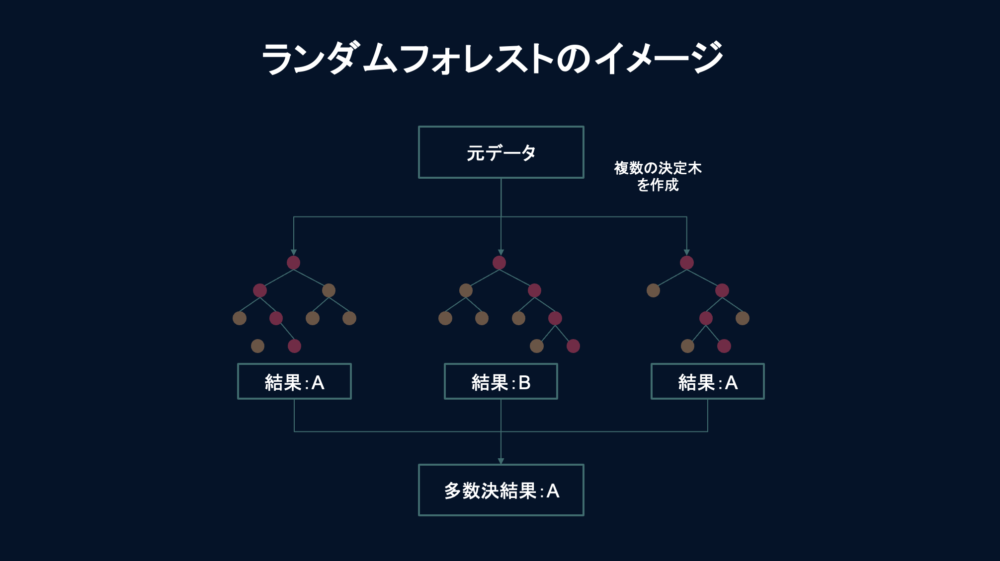

### <font color=#0e89b2>2)ランダムフォレストの実装</font>

練習問題2で登場した家賃予測をランダムフォレストでも実装してみて、<br>
決定木よりも精度が上がるか見てみましょう。

In [ ]:
#####写経#####
from sklearn.datasets import fetch_california_housing
housing_data = fetch_california_housing()
# 目的変数
exp_data = pd.DataFrame(housing_data.data, columns=housing_data.feature_names)
# 説明変数
tar_data = pd.DataFrame(housing_data.target, columns=['HousingPrices'])
# データを結合
housing_data = pd.concat([exp_data, tar_data], axis=1)

housing_data.head()

,MedInc,HouseAge,AveRooms,AveBedrms,Population,AveOccup,Latitude,Longitude,HousingPrices
0,8.3252,41.0,6.984127,1.023810,322.0,2.555556,37.88,-122.23,4.526
1,8.3014,21.0,6.238137,0.971880,2401.0,2.109842,37.86,-122.22,3.585
2,7.2574,52.0,8.288136,1.073446,496.0,2.802260,37.85,-122.24,3.521
3,5.6431,52.0,5.817352,1.073059,558.0,2.547945,37.85,-122.25,3.413
4,3.8462,52.0,6.281853,1.081081,565.0,2.181467,37.85,-122.25,3.422


In [ ]:
#####写経#####
#回帰木モデル構築のためのライブラリをインポート
from sklearn.ensemble import RandomForestRegressor

#説明変数と目的変数をセット
x = housing_data.drop('HousingPrices', axis=1)
y = housing_data['HousingPrices']

#学習データとテストデータを分割
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.5, random_state=0)

#ステップ１：重回帰モデルの構築
model = RandomForestRegressor()

#ステップ２：学習
model.fit(x_train,y_train)

#ステップ3-4：予測&評価
model.score(x_test,y_test)

0.7892476759079046

<font color=#f27405>決定木のときの決定係数は0.63だったのに対して、ランダムフォレストは0.79と精度が向上</font>しています。<br>
しかもかなり高い精度が出ていることがわかります。<br>

### <font color=#0e89b2>3)関連知識：過学習の防止</font>

#### <font color=#0e89b2>a. 過学習とは</font>

過学習とは、<font color=#f27405>学習データに過剰適合</font>しすぎて、<br>
<font color=#f27405>学習データに対しては高い精度が出るが、テストデータに対しては精度が悪い</font>状態のことです。<br>
<br>
受験生で例えて言うと、過去問をがちがちに対策して、過去問と同じ問題が出れば高い点数を取れるが、<br>
知らない問題が出ると全く対応できず、一気に点数が下がってしまうような状態です。

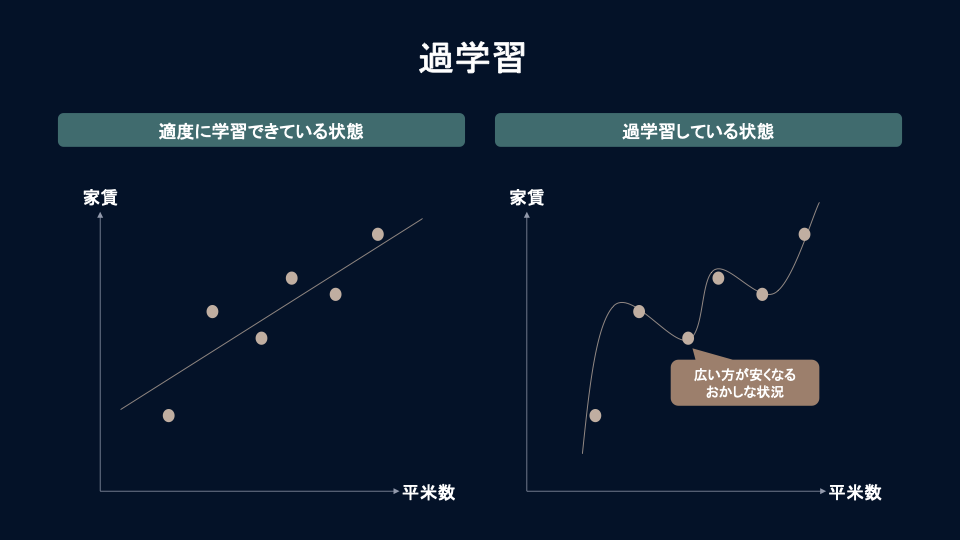

#### <font color=#0e89b2>b. 過学習のチェック方法</font>

上のランダムフォレストが過学習を起こしていないかを見てみましょう。<br>
過学習を起こしていないかをチェックする方法は簡単で、<br>
<font color=#f27405>学習データのスコアとテストデータのスコアが大きく乖離していないか</font>を見ればよいです。

In [ ]:
#####写経#####
#学習データのスコア
model.score(x_train, y_train)

0.9715449664604052

In [ ]:
#####写経#####
#テストデータのスコア
model.score(x_test, y_test)

0.7892476759079046

学習データの決定係数は0.97ととんでもなく高いスコアが出ているのに対し、<br>
テストデータでは0.79と、大きく乖離していることがわかります。

#### <font color=#0e89b2>c. 過学習の解消方法</font>

過学習の解消方法には、以下のようなものがあります。<br>
<br>


---


*   <font color=#f27405>学習データの増量</font>
 * あらゆるモデルについて有効
*   <font color=#f27405>ハイパーパラメータの調整</font>
 * 特に有効なモデル：決定木、ランダムフォレスト
 * 例えば決定木では、分岐が深いほどモデルが複雑化して過学習を起こしやすいが、分岐の深さというハイパーパラメータを調整することで、過学習を防げる
*   <font color=#f27405>正則化</font>
 * 特に有効なモデル：重回帰
 * あまり有効でないモデル：SVM（元々正則化項がモデルの式に組み込まれている）、アンサンブル学習（モデルの多様性によって過学習を抑えている。ex.ランダムフォレスト)
 * 複雑化してしまったモデルを単純なモデルへと戻していく手法
 * 「L1正規化」と「L2正規化」の2つの手法が存在
 * <font color=#f27405>L1（ラッソ）</font>：余計な説明変数を減らす
 * <font color=#f27405>L2（リッジ）</font>：係数の値を小さくする


---



#### <font color=#0e89b2>d. ハイパーパラメータ調整で過学習を解消してみる</font>

決定木やランダムフォレストでは、<br>
モデル構築時に<font color=#f27405>"max_depth"というパラメータを設定することで分岐の深さの上限を設定</font>し、<br>
モデルの過剰な複雑化を防ぐことができます。<br>
<br>
まずはmax_depthを設定しない場合のスコアを表示します。

In [ ]:
#####写経#####
#max_depthが∞の場合
model = RandomForestRegressor()
model.fit(x_train,y_train)
print("学習データの決定係数: ", model.score(x_train, y_train))
print("テストデータの決定係数: ", model.score(x_test,y_test))

学習データの決定係数:  0.9719608408713295
テストデータの決定係数:  0.7889805094936782


max_depthが10の場合です。

In [ ]:
#####写経#####
#max_depthが10の場合
model = RandomForestRegressor(max_depth=10)
model.fit(x_train,y_train)
print("学習データの決定係数: ", model.score(x_train, y_train))
print("テストデータの決定係数: ", model.score(x_test,y_test))

学習データの決定係数:  0.8814454910255363
テストデータの決定係数:  0.7661321730548603


max_depthが5の場合です。

In [ ]:
#####写経#####
#max_depthが5の場合
model = RandomForestRegressor(max_depth=5)
model.fit(x_train,y_train)
print("学習データの決定係数: ", model.score(x_train, y_train))
print("テストデータの決定係数: ", model.score(x_test,y_test))

学習データの決定係数:  0.6882483892800166
テストデータの決定係数:  0.6562870018217006


<font color=#f27405>学習データとテストデータのスコア差が徐々に小さくなり、過学習が解消</font>されていることが分かります。<br>
このようにハイパーパラメータを良い匙加減で調整し、モデルの精度と過学習防止のバランスが取れたポイントを見つけることが大事です。

#### <font color=#0e89b2>e. 正則化で過学習を解消してみる</font>

##### <font color=#0e89b2>L1正則化(ラッソ回帰)</font>

正則化による過学習解消もやってみます。<br>
正則化は主に重回帰におけるトピックなので、一旦ランダムフォレストは忘れて、重回帰に頭を切り替えて下さい。<br><br>
まず、L1正則化について説明していきます。<br>
L1正則化を行わないといけない典型例は下の図のような場面です。<br>
<br>
部屋の広さからマンション価格を予測する回帰モデルですが、この回帰式の形状は明らかにおかしいです。<br>
例えば、<font color=#f27405>部屋の広さが広い方が価格が安くなっている箇所</font>がありますよね。

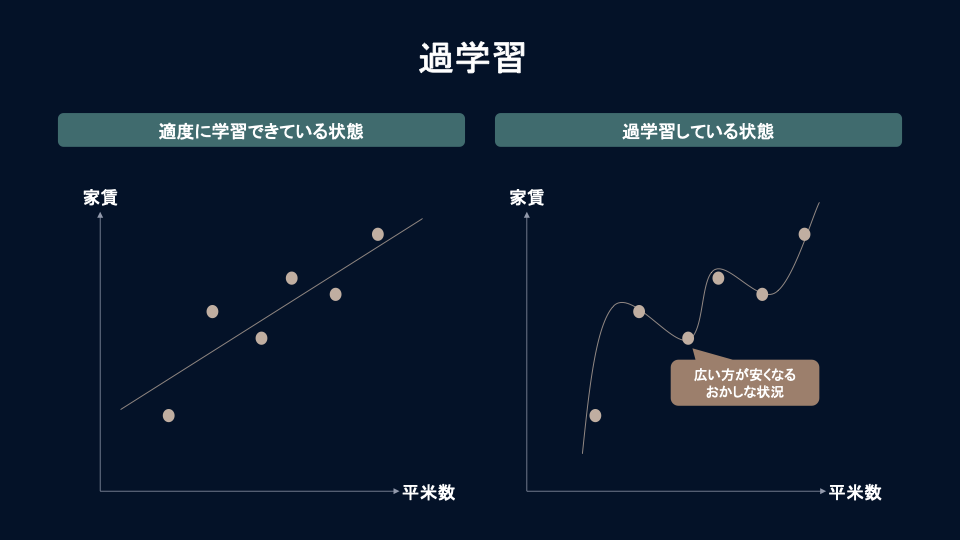

このように回帰式が不必要にぐにゃぐにゃになっているのは、余計な説明変数が多くなっているからです。<br>
これを下の図のように、<font color=#f27405>余計な説明変数をなくして、シンプルな形状に直してあげる</font>のがL1正則化のイメージです。

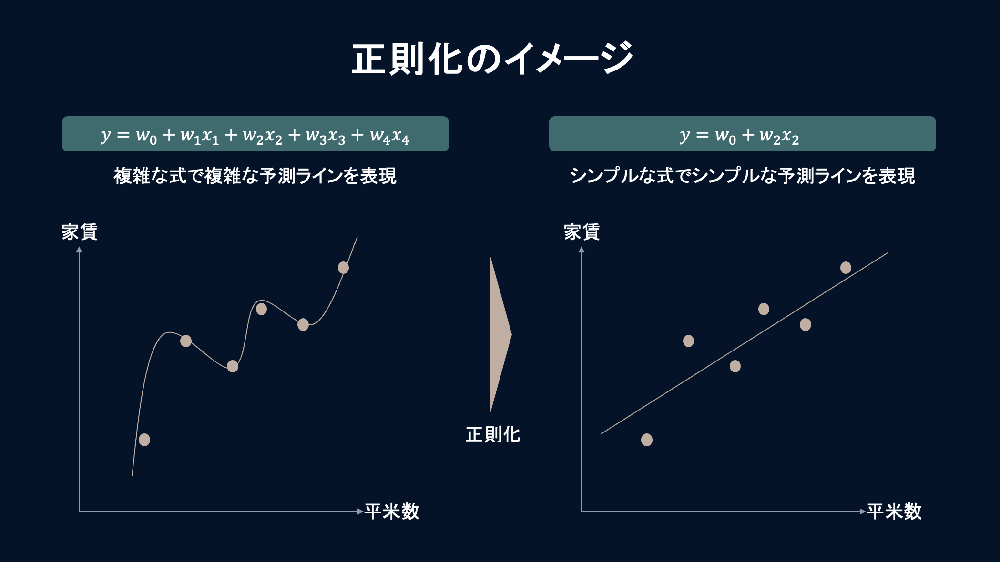

実際にL1正則化のコーディングを行っていきます。<br>
まずは再度、重回帰の時に用いた糖尿病データを準備します。

In [ ]:
#糖尿病データの再準備
diabetes = datasets.load_diabetes()
exp_data = pd.DataFrame(diabetes.data, columns=diabetes.feature_names)
tar_data = pd.DataFrame(diabetes.target, columns=['target'])
df_diabetes = pd.concat([exp_data, tar_data], axis=1)
df_diabetes_dropped = df_diabetes.drop("s2", axis=1)
df_diabetes_dropped.head()

,age,sex,bmi,bp,s1,s3,s4,s5,s6,target
0,0.038076,0.050680,0.061696,0.021872,-0.044223,-0.043401,-0.002592,0.019907,-0.017646,151.0
1,-0.001882,-0.044642,-0.051474,-0.026328,-0.008449,0.074412,-0.039493,-0.068332,-0.092204,75.0
2,0.085299,0.050680,0.044451,-0.005670,-0.045599,-0.032356,-0.002592,0.002861,-0.025930,141.0
3,-0.089063,-0.044642,-0.011595,-0.036656,0.012191,-0.036038,0.034309,0.022688,-0.009362,206.0
4,0.005383,-0.044642,-0.036385,0.021872,0.003935,0.008142,-0.002592,-0.031988,-0.046641,135.0


L1正則化を行わない重回帰では、このような精度になっていました。

In [ ]:
#####写経#####
#重回帰モデル構築のためのライブラリをインポート
from sklearn.linear_model import LinearRegression

#説明変数と目的変数をセット
x = df_diabetes_dropped.drop('target', axis=1)
y = df_diabetes_dropped['target']

#学習データとテストデータを分割
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.5, random_state=0)

#ステップ１：重回帰モデルの構築
model = LinearRegression()

#ステップ２：学習
model.fit(x_train,y_train)

#ステップ3-4：予測&評価
print("学習データの決定係数: ", model.score(x_train, y_train))
print("テストデータの決定係数: ", model.score(x_test,y_test))

学習データの決定係数:  0.5715317336945218
テストデータの決定係数:  0.4347826803223025


これを、L1正則化を行ったバージョンでやってみます。<br>
実はscikit learnでは、L1正則化を行った重回帰が「ラッソ回帰」というモデルとしてそもそも用意されているので、<br>
これまでの重回帰や決定木などと同様の手順で実装できます。

In [ ]:
#####写経#####
#ラッソ回帰モデル構築のためのライブラリをインポート
from sklearn.linear_model import Lasso

#ステップ１：ラッソ回帰モデルの構築
lasso = Lasso(alpha=1.0) #alphaで正則化の強さを指定できます

#ステップ２：学習
lasso.fit(x_train,y_train)

#ステップ3-4：予測&評価
print("学習データの決定係数: ", lasso.score(x_train, y_train))
print("テストデータの決定係数: ", lasso.score(x_test,y_test))

学習データの決定係数:  0.4176867276430928
テストデータの決定係数:  0.35615952730086353


精度はやや下がった代わりに、学習データとテストデータのスコア差が小さくなり、過学習が抑制されたことが分かります。

##### <font color=#0e89b2>L2正則化(リッジ回帰)</font>

例えば、このような回帰モデルがあるとします。（数値は適当です）<br>
<br>

* 家賃=広さ×1,568,901-築年数×900,193


このモデルでは、<font color=#f27405>係数の値が大きい</font>ために、<br>
ちょっとでも広さが広いと家賃が跳ね上がるし、ちょっとでも築古だと家賃が激値下げするという、<br>
<font color=#f27405>変数のちょっとした大小に対しても過敏なモデル</font>（過学習気味のモデル）になっています。<br>
<br>
リッジ回帰は、以下のように係数を小さめに調整してあげて、より汎用的なモデルにしてあげる仕組みです。<br>

* 家賃=広さ×3-築年数×2（数値は適当です）



ラッソ回帰の時と同様、scikit learnで簡単に実装できます。

In [ ]:
#####写経#####
#リッジ回帰モデル構築のためのライブラリをインポート
from sklearn.linear_model import Ridge

#ステップ１：リッジ回帰モデルの構築
ridge = Ridge(alpha=1.0) #alphaで正則化の強さを指定できます

#ステップ２：学習
ridge.fit(x_train,y_train)

#ステップ3-4：予測&評価
print("学習データの決定係数: ", ridge.score(x_train, y_train))
print("テストデータの決定係数: ", ridge.score(x_test,y_test))

学習データの決定係数:  0.42864485599958635
テストデータの決定係数:  0.3770052832197466


##### <font color=#0e89b2>L1正則化とL2正則化の使い分け</font>

ざっくり言うと、

---

* 説明変数の数が多い場合：<font color=#f27405>L1正則化</font>（説明変数の数自体を思い切って減らす）
* 説明変数の数が少ない場合：<font color=#f27405>L2正則化</font>（説明変数は減らさず、係数を最適化する）

---

という使い分け方が一般的です。<br>
<br>
ただ、上のように両方実装してスコアを出してみて、より良さそうな方を選択するのが良いでしょう。<br>
上の例で言えば、精度、学習データとテストデータのスコア差（過学習の抑制度合い）ともに、L2正則化の方が良さそうですね。

# <font color=#0e89b2>3. 分類モデルの実装</font>

## <font color=#0e89b2>3.1 ロジスティック回帰</font>

### <font color=#0e89b2>1)ロジスティック回帰とは</font>

ここまで回帰モデルの実装を行ってきました。<br>
ここからは分類モデルを実装していきます。<br>
<br>
分類モデルで予測したい結果は、例えば「犬か猫か」とか、「合格か不合格か」みたいな、<font color=#f27405>カテゴリ</font>になります。<br>
<br>
一方何度も繰り返している通り、機械学習というのは<font color=#f27405>数学モデル</font>です。<br>
数式の計算結果から出てくるのはもちろん数値なので、「犬か猫か」みたいな答えは出てきません。<br>
<br>
ではどうするかというと、方法として編み出されたのが、<br>
<font color=#f27405>回帰で確率値を求めて、確率が50%以上か未満かによってカテゴリ分類する</font><br>
という方法です。これがロジスティック回帰です。<br>
<br>
下の図をご覧ください。<br>
線形回帰のときに、ちょうど点の集まりの真ん中あたりを良い感じに通るように予測ラインを引いていました。<br>
それが二値分類になるとこういう曲線で予測ラインを引きます。<br>
この予測ラインは、x軸は勉強時間、y軸は<font color=#f27405>合格する確率値</font>を表しています。<br>
<br>
ロジスティック「回帰」という名前なので回帰モデルと勘違いするかもしれませんが、<br>
確率値を「回帰」で求めてカテゴリ分類を行っているという意味であって、あくまで分類モデルです。

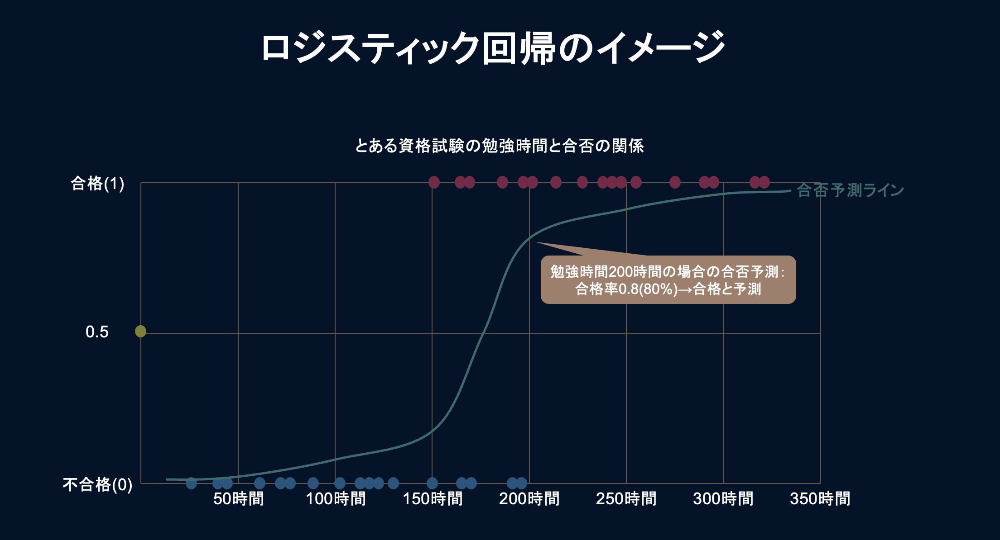

### <font color=#0e89b2>2)ロジスティック回帰の実装</font>

matplotlibのパートで使ったアヤメのデータを再び使います。<br>
2種類のアヤメ（versicolorとvirginica）の花弁とがくの長さのデータが入っています。

In [ ]:
from sklearn import datasets
iris_data = datasets.load_iris()
iris = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
iris['species'] = [iris_data.target_names[i] for i in iris_data.target]
iris = iris[(iris['species']=='versicolor') | (iris['species']=='virginica')].reset_index(drop=True)
iris.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,7.0,3.2,4.7,1.4,versicolor
1,6.4,3.2,4.5,1.5,versicolor
2,6.9,3.1,4.9,1.5,versicolor
3,5.5,2.3,4.0,1.3,versicolor
4,6.5,2.8,4.6,1.5,versicolor


ちなみにversiclorはこれ。

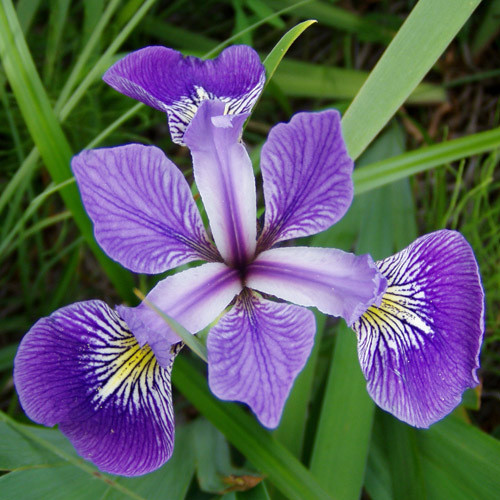

virginicaはこれ。

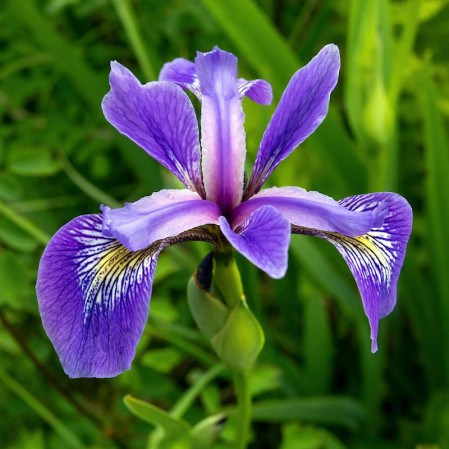

素人目には違いはあまり分かりませんが、この2種の分類を予測するモデルを作ってみましょう。<br>
作り方は回帰のときと同じです。<br>
<br>
ちなみに目的変数（versicolorかviriginicaか）については、<br>
versicolorは0、virginicaは1のようなラベルエンコーディングを行わなくても、<br>
scikit learnは動作します。

In [ ]:
#####写経#####
#ロジスティック回帰モデルの構築のためのライブラリをインポート
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

#説明変数のセット
x = iris.drop("species", axis=1)
#目的変数のセット
y = iris['species']
#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#モデル構築
model = LogisticRegression()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  0.9714285714285714
テストデータの正解率:  0.9666666666666667


### <font color=#0e89b2>3)分類モデルの評価指標</font>

#### <font color=#0e89b2>a. 混同行列</font>

分類モデルの評価指標について学ぶ際に、まず知っておかないといけないのが<font color=#f27405>混同行列</font>です。

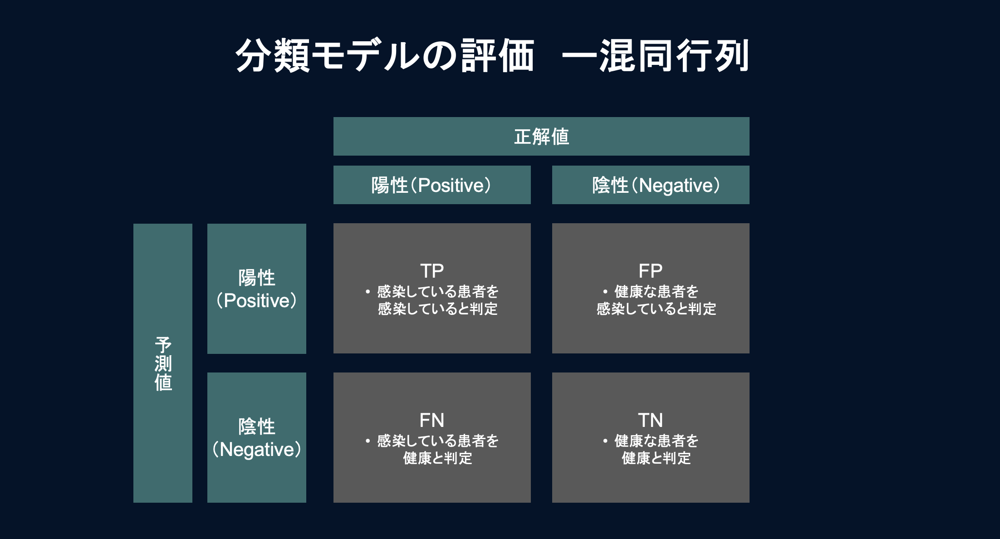

例えばインフルエンザ診断でいうと、<br>
* インフルエンザ陽性と診断して本当に陽性だった場合は<font color=#f27405>TP</font>
* インフルエンザ陰性と診断したが実際は陽性だった場合は<font color=#f27405>FN</font>

です。<br>

#### <font color=#0e89b2>b. 4つの評価指標</font>

この混同行列の考え方をベースにして、4つの主な評価指標があります。<br>


---


*   <font color=#f27405>正解率</font>（Accuracy）：(TP+TN) / (TP+TN+FP+FN)
 * 予測結果全体に対して正しく予測できた割合
 * 一番基本的な指標
 * 使用場面例：オールマイティ
*   <font color=#f27405>適合率</font>（Precision）：TP / (TP+FP)
 * ポジティブと予測したものが実際にポジティブだった割合
 * 使用場面例：メールのスパム判定（スパムと判定したものが正規の重要メールだった場合は大問題）
*   <font color=#f27405>再現率</font>（Recall）：TP / (TP+FN)
 * 実際にポジティブなものをどれくらいポジティブと予測出来たかを示す割合
 * 使用場面例：感染症の診断（陽性患者を見逃すと更なる感染の恐れ）
*   <font color=#f27405>F値</font>（F1-Score）：2×(適合率×再現率) / (適合率÷再現率)
 * 適合率と再現率の両方の傾向を反映した指標
 * 適合率と再現率はトレードオフの関係にあるため、中間となるF値を見ると良い
 * 使用場面例：オールマイティ
---



上のmodel.score()で表示されている数値は、正解値です。

## <font color=#0e89b2>3.2 サポートベクターマシン(SVM)</font>

### <font color=#0e89b2>1)サポートベクターマシンとは</font>

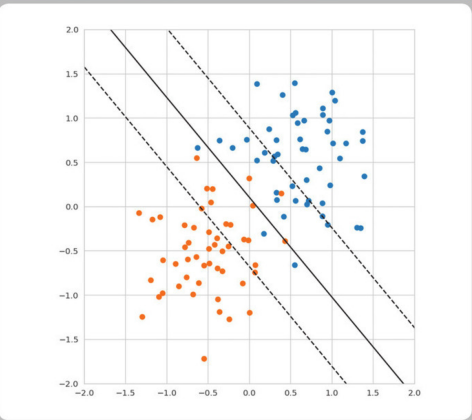

回帰のパートでは扱いませんでしたが、実は回帰にも分類にも使えるアルゴリズムです。<br>
汎用性も精度も高いため、ディープラーニング登場前はかなり人気を博していました。<br>
<br>
仕組みは超簡単に言ってしまえば、<br>
図のように<font color=#f27405>赤と青をなるべく綺麗に分断できるような線を引く</font>アルゴリズムです。<br>
<br>
ちなみにこの線のことは決定境界といいます。<br>
2次元（2変数）の場合は境界は線ですが、3次元の場合は平面、四次元以上の場合は超平面になります。<br>

### <font color=#0e89b2>2)サポートベクターマシンの仕組み</font>

ここは余力があれば読む程度でOKですが、線を引く仕組みについてもう少し説明します。<br>
<br>
決定境界から最も近い赤の点と青の点を、<font color=#f27405>サポートベクトル</font>と呼びます。<br>
これがサポートベクターマシン(SVM)の名前の由来です。<br>
<br>
また、このサポートベクトルと境界線の距離を<font color=#f27405>マージン</font>と呼びます。<br>
このマージンが最大となるようにパラータを更新していくことで、最適な境界線を見つけることができます。<br>
<br>
ちなみにここまでの話だと、サポートベクターマシンは線形の識別器でしたが、<br>
<font color=#f27405>カーネル法</font>と呼ばれる手法を用いると、複雑な境界も設定できます。<br>
例えば、下の図のような円形の境界を引くこともできます。

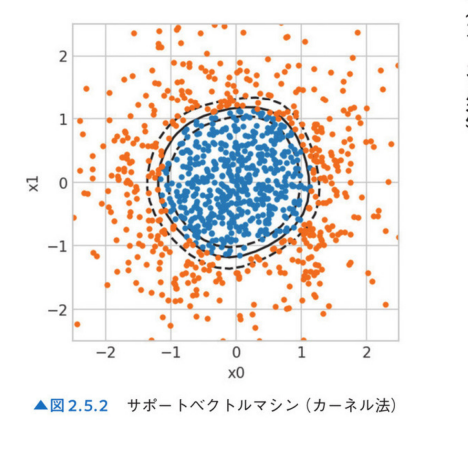

### <font color=#0e89b2>3)ロジスティック回帰・SVM・決定木の違い</font>

ロジスティック回帰は、境界線が直線であることを前提としているアルゴリズムです。<br>
なので、下の図のように入り組んだデータに対しては、精度が不十分になってしまいます。

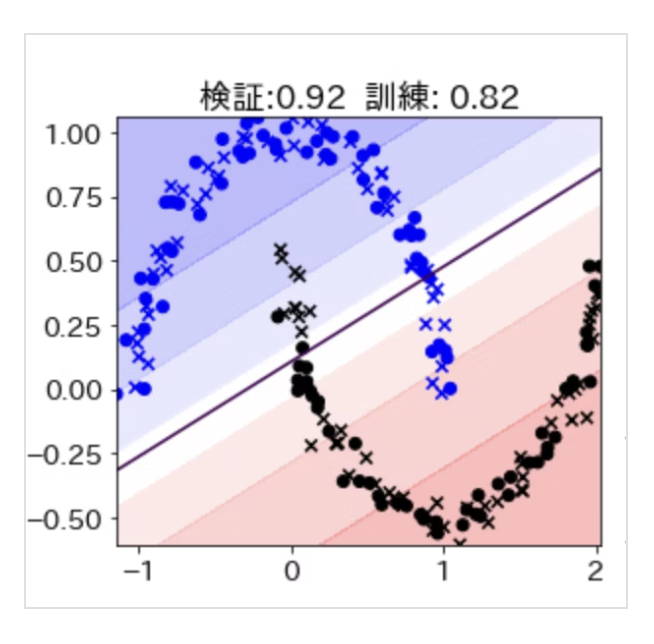

一方サポートベクターマシン（カーネル法）は、複雑な境界線を引けるので、<br>
入り組んだデータに対しても柔軟に対応できます。

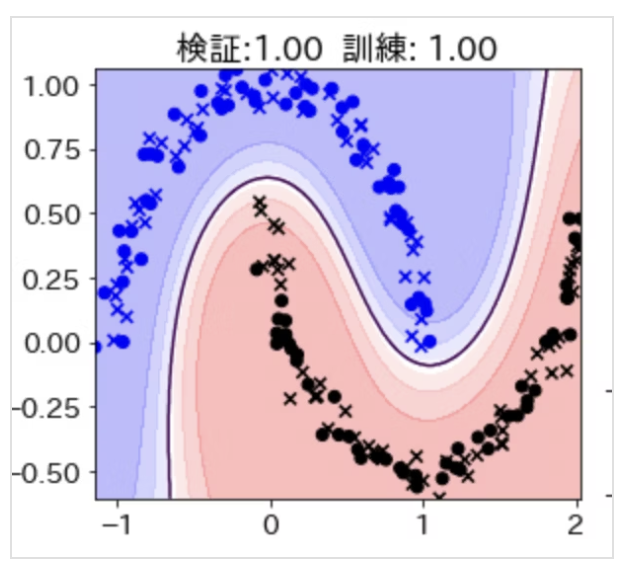

決定木の場合は、境界線は直線ですが、カクカクと細かく境界を区切っていけるので、<br>
入り組んだデータでも対応可能です。

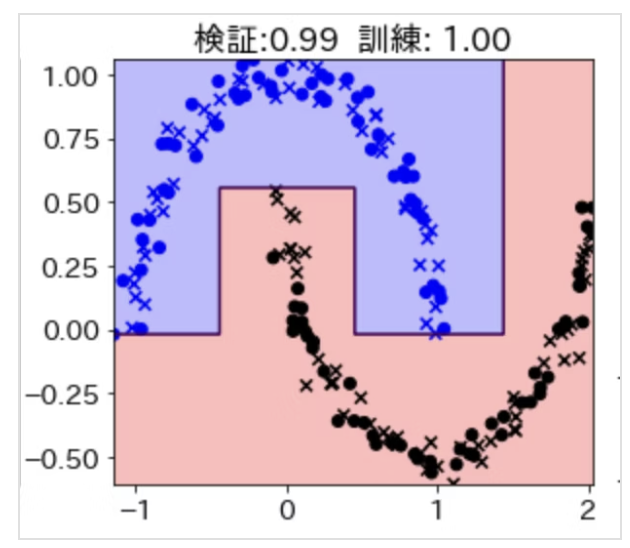

### <font color=#0e89b2>4)サポートベクターマシンの実装</font>

今回は乳がんのデータを用います。<br>
データを準備します。

In [ ]:
from sklearn.datasets import load_breast_cancer
cancer_data = load_breast_cancer()
# 目的変数
exp_data = pd.DataFrame(cancer_data.data, columns=cancer_data.feature_names)
# 説明変数
tar_data = pd.DataFrame(cancer_data.target, columns=['target'])
# データを結合
cancer_data = pd.concat([exp_data, tar_data], axis=1)

cancer_data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


### <font color=#0e89b2>5)関連知識ーデータの標準化</font>

毎回やることは同じ、もはやルーティンワークになってきましたが、サポートベクターマシンのモデルを実装していきます。

In [ ]:
#####写経#####
from sklearn.svm import SVC

#説明変数と目的変数のセット
x = cancer_data.drop("target", axis=1)
y = cancer_data["target"]

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#モデル構築
model = SVC()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  0.9045226130653267
テストデータの正解率:  0.9239766081871345


ちなみにサポートベクターマシンでは、データの<font color=#f27405>標準化</font>を行うと、精度が向上することが多いです。<br>
標準化とは、平均が0、分散が1になるようにデータを変換することです。<br>
<br>
この辺りの精度向上手法は後ほど整理してまとめますが、まずはここではとにかく標準化を行ってみます。<br>
<br>
データの標準化を行う際には、scikit-learnで準備されている、<font color=#f27405>StandardScaler</font>というメソッドを使います。

In [ ]:
#####写経#####
#データの標準化に必要なライブラリをインポート
from sklearn.preprocessing import StandardScaler

#標準化
sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

#クラスの初期化と学習
model = SVC()
model.fit(x_train_std,y_train)

#学習データとテストデータのスコア
print("学習データの正解率: ", model.score(x_train_std, y_train))
print("テストデータの正解率: ", model.score(x_test_std,y_test))

学習データの正解率:  0.9824120603015075
テストデータの正解率:  0.9766081871345029


タレコミ通り、精度が向上する結果となりました。

## <font color=#0e89b2>3.3 k近傍法</font>

### <font color=#0e89b2>1)k近傍法とは</font>

k近傍法の仕組みは分かりやすく言うと、<br>
<font color=#f27405>予測したいデータと距離が近い数個のデータを取り出して、
そのデータでAが多ければA、Bが多ければB</font><br>
と判定するアルゴリズムです。<br>
<br>
例えば下の図の例で説明します。<br>
今、身長と体重から、その人が男か女かを予測したいとします。<br>
男女複数人の身長・体重データはすでにあり、図にマッピングしてあります。<br>
この上に、予測したい人の身長・体重の点をプロットしてあげます。<br>
この点から一番距離が近い点を3つ選び、（この距離の求め方は、中学や高校で習うレベルの簡単な数学ですね）<br>
男性の点の方が多ければ男性、女性の点の方が多ければ女性と判定するわけです。

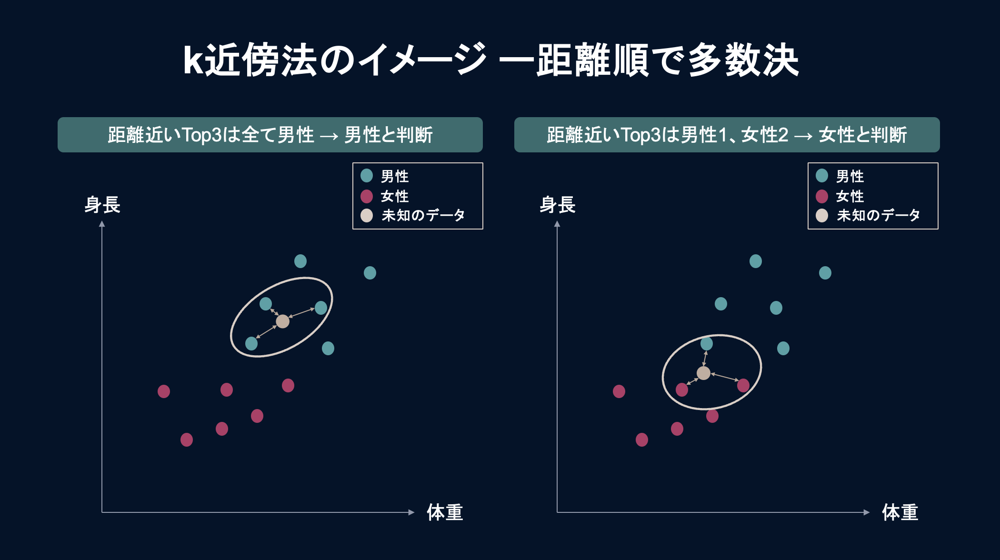

このように仕組みは単純なのですが、意外と複雑な決定境界を学習できます。

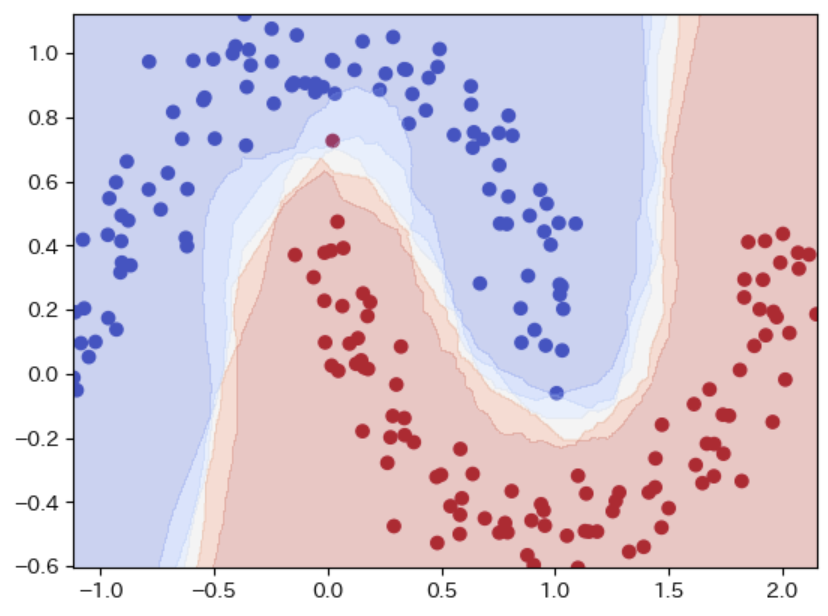

複雑な決定境界も学習でき、ロジックもわかりやすいk近傍法ですが、弱点があります。<br>
それは、<font color=#f27405>データ数が多い場合・次元数が高い場合には不向き</font>であるということです。<br>
<br>
次元についてですが、例えば上の例だと身長と体重という二次元の話ですが、これに足の大きさなどが加わって三次元になると、精度が悪化します。<br>
これは、二次元の場合だと「距離が近いものは似たもの同士だろう」というシンプルなロジックが通用しやすいのですが、<br>
三次元・四次元となってくると、そう簡単な話でもなくなってくるからです。<br>
<br>
なので実務の場面では、<br>
データが二次元で、かつ説明性（AIに詳しくないお偉いさんに説明するときの分かりやすさ）が求められる場合<br>
に使うと良いでしょう。

### <font color=#0e89b2>2)k近傍法の実装</font>

k近傍法を実装してみます。<br>
<br>
scikit-learnの中に面白いデータセットがあるので、今回はこれを使ってみます。<br>
make_moonsというデータセットでは、三日月状に分布したデータを作成することができます。<br>
<br>
早速可視化してみます。

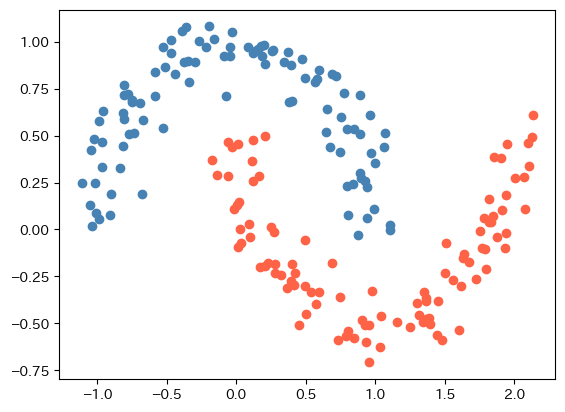

In [ ]:
#####写経#####
#三日月状に分布するデータをプロット
from sklearn.datasets import make_moons
x, y = make_moons(n_samples=200, noise=0.1)

a0, b0 = x[y==0,0], x[y==0,1]
a1, b1 = x[y==1,0], x[y==1,1]

plt.scatter(a0, b0, color="steelblue")
plt.scatter(a1, b1, color="tomato")

三日月状に分布するデータが作成できました。<br>
ちなみに引数の"noise"をいじると、もっと綺麗な三日月や粗い三日月を作ることができます。<br>
<br>
このデータに対して、いつも通り機械学習モデルを実装していきます。

In [ ]:
#####写経#####
from sklearn.neighbors import KNeighborsClassifier

#説明変数と目的変数のセット
x, y = make_moons(n_samples=200, noise=0.1)

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

#モデル構築
model = KNeighborsClassifier()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  1.0
テストデータの正解率:  1.0


このように、分布の形状はイレギュラー（今回は三日月形）であっても、<br>
境界がはっきりと分離していれば、高精度で判別できることがわかります。

### <font color=#0e89b2>3)決定境界の可視化</font>

せっかくなので決定境界の可視化も行ってみましょう。<br>
上申の際のプレゼンなどでは、ビジュアルでデータを示すと説得力を増し、強力な武器になります。<br>
<br>
決定境界を示すためのコードはこちらで用意しています。<br>
特に実装方法を学ぶ必要はなく、コピペでokです。<br>
<br>
余裕があれば、可視化ロジックも調べてみてください。<br>
簡単に言えば、<font color=#f27405>確率値の等高線</font>です。

In [ ]:
#####写経#####
#決定境界を表示する関数
def show_boundary(x, y, model):
    #データの整形
    X1 = x[:,0]
    X2 = x[:,1]
    f1_min, f1_max = X1.min(), X1.max()
    f2_min, f2_max = X2.min(), X2.max()
    f1_range = np.arange(f1_min, f1_max+0.005, 0.005)
    f2_range = np.arange(f2_min, f2_max+0.005, 0.005)
    f1, f2 = np.meshgrid(f1_range, f2_range)
    w = np.c_[f1.ravel(), f2.ravel()]
    Z = model.predict_proba(w)[:,1]
    W = Z.reshape(f1.shape)

    # グラフ描画
    plt.scatter(X1, X2, c=y, cmap=cm.coolwarm)
    plt.contourf(f1, f2, W, cmap=cm.coolwarm, alpha=0.3)

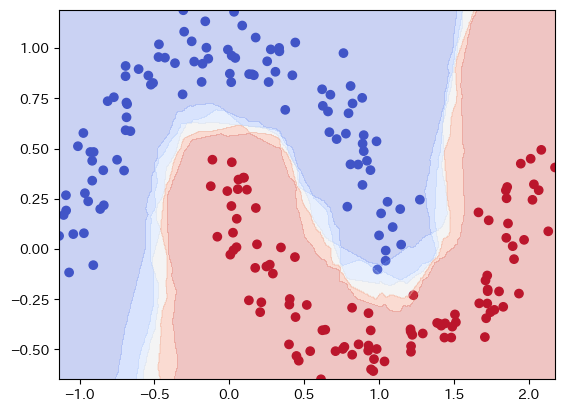

In [ ]:
#####写経#####
#決定境界を表示
show_boundary(x, y, model)

### <font color=#0e89b2>練習問題4：環状データにk近傍法を適用する</font>

sklearn.datasetsのmake_circlesというデータセットを使って、k近傍法モデルを実装してください。

(1) make_circlesのデータを読み込み、散布図としてプロットしてください。<br>
データの扱い方は、make_moonsの時と同じです。

In [ ]:
#make_circlesのデータを読み込み、散布図としてプロット


解答

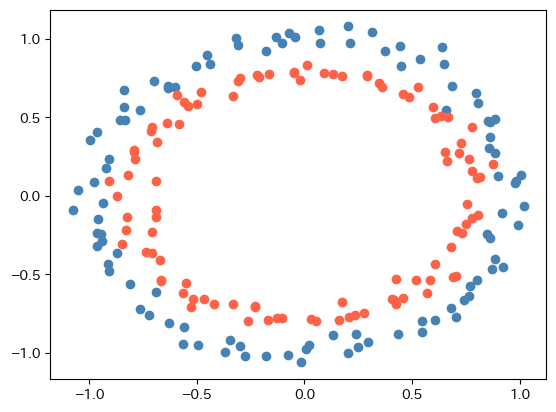

In [ ]:
#make_circlesのデータを読み込み、散布図としてプロット
from sklearn.datasets import make_circles
x, y = make_circles(n_samples=200, noise=0.05)

a0, b0 = x[y==0,0], x[y==0,1]
a1, b1 = x[y==1,0], x[y==1,1]

plt.scatter(a0, b0, color="steelblue")
plt.scatter(a1, b1, color="tomato")

(2) k近傍法のモデルを実装し、学習データとテストデータそれぞれのスコアを表示してください。<br>
余裕があれば、下記の引数をいじって、スコアがどう変わるか実験してみてください。<br>
* make_circlesの引数のnoise
* k近傍法モデルの引数n_neighbors（近傍オブジェクト数）
<br>

ちなみに近傍オブジェクト数というのは、「多数決を取るときに、何票取るか」のことです。

In [ ]:
#k近傍法モデルを実装


解答

In [ ]:
#k近傍法モデルを実装
from sklearn.datasets import make_circles
from sklearn.neighbors import KNeighborsClassifier

#説明変数と目的変数のセット
x, y = make_circles(n_samples=200, noise=0.05)

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

#モデル構築
model = KNeighborsClassifier()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  0.9714285714285714
テストデータの正解率:  0.9166666666666666


ちなみに<font color=#f27405>近傍オブジェクト数</font>は、このような特徴があります。
* 小さすぎるとノイズ（外れ値）に弱くなる
* 大きすぎると精度が悪くなる
<br>

理由は、考えてみればすぐ分かると思うので、考えてみてください。

(3) 決定境界を可視化してください。

In [ ]:
#決定境界を可視化


解答

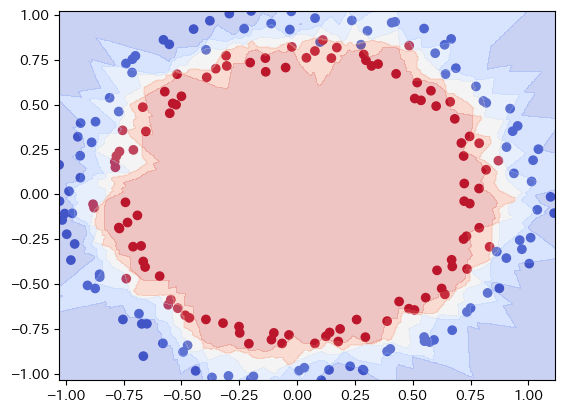

In [ ]:
#決定境界を可視化
show_boundary(x, y, model)

(4) ロジスティック回帰モデルを実装し、決定境界を可視化してください。

In [ ]:
#ロジスティック回帰モデルを実装


In [ ]:
#決定境界を可視化


解答

In [ ]:
#ロジスティック回帰モデルを実装
from sklearn.datasets import make_circles
from sklearn.linear_model import LogisticRegression

#説明変数と目的変数のセット
x, y = make_circles(n_samples=200, noise=0.05)

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

#モデル構築
model = LogisticRegression()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  0.4857142857142857
テストデータの正解率:  0.48333333333333334


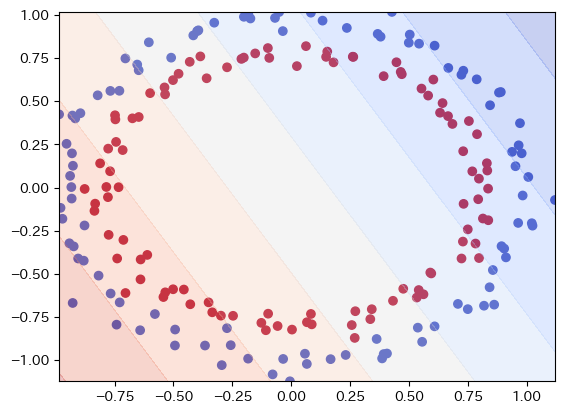

In [ ]:
#決定境界を可視化
show_boundary(x, y, model)

<font color=#f27405>ロジスティック回帰モデルでは全く精度が出ず、決定境界も全く機能していない</font>ことがわかります。<br>
というか青か赤かを当てる二択問題で精度が43%だと、でたらめに当てるよりももはや精度悪くなっちゃってます。<br>
<br>
決定境界が機能していないことについて補足します。<br>
先ほどちらっと言った通り、この決定境界は「確率値の等高線」です。<br>
左下に行くほど赤である確率が高く、右上に行くほど青である確率が高いとこのモデルは言ってるわけですが、<br>
全く実態に則していないですよね。<br>
<br>
この等高線を見て明らかなように、ロジスティック回帰モデルは<font color=#f27405>線形の分類機</font>なので、<br>
今回のような環状に分類するデータは、<font color=#f27405>ロジスティック回帰モデルが不得意な典型例</font>というわけです。

### <font color=#0e89b2>練習問題5：k近傍法でハイパーパラメータチューニング</font>

ハイパーパラメータチューニングとは、<font color=#f27405>モデルのパラメータを調整することで、より精度を上げていくこと</font>です。<br>
例えばk近傍法は、「多数決」の仕組みだと説明しましたが、多数決を取る際に<font color=#f27405>「何票とるのか」</font>は重要なパラメータです。<br>
また決定木では、<font color=#f27405>「分岐を何階層まで作るのか」</font>が重要なパラメータです。<br>
<br>
詳しいことはこの後の「機械学習基礎④上級者への道」で学習していくのですが、<br>
ここでk近傍法のハイパーパラメータチューニングを行ってみましょう。

#### <font color=#0e89b2>練習問題5-1：k近傍法の実装</font>

まずはデータを準備します。

In [ ]:
#データやモデルを構築するためのライブラリをインポート
from sklearn.datasets import load_breast_cancer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split

#データセットの読み込み(乳がんデータの利用)
cancer = datasets.load_breast_cancer()

#学習データとテストデータに分割する
x_train,x_test,y_train,y_test = train_test_split(cancer.data, cancer.target, stratify=cancer.target, random_state=0)

ここから、k近傍法モデルを実装して、学習データ・テストデータそれぞれに対しての正解率を表示してください。

In [ ]:
#k近傍法モデルの実装


解答

In [ ]:
model = KNeighborsClassifier()
model.fit(x_train,y_train)
print("学習データの正解率：", model.score(x_train,y_train))
print("テストデータの正解率：", model.score(x_test,y_test))

学習データの正解率： 0.9460093896713615
テストデータの正解率： 0.916083916083916


#### <font color=#0e89b2>練習問題5-2：ハイパーパラメータチューニング</font>

x軸にn_neibors(多数決の際に何票とるのか）の値(1〜20)、縦軸に正解率(0〜1)をとって、<br>
学習データとテストデータそれぞれの正解率の推移のグラフを1つの図の中に描画してください。

In [ ]:
#n_neiborsの値による正解率推移のグラフを描画


解答

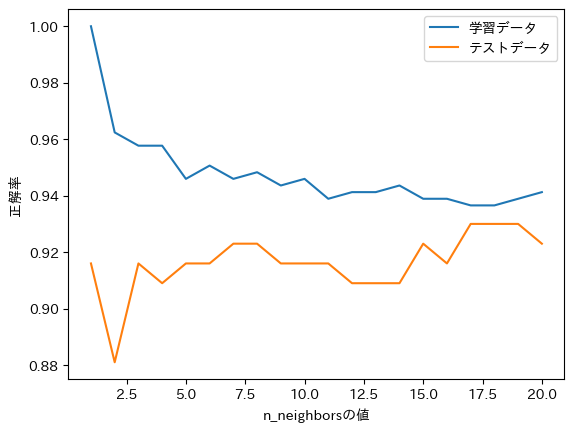

In [ ]:
#n_neiborsの値による正解率推移のグラフを描画
#グラフ描画用のリストを用意
training_accuracy = []
test_accuracy = []

#学習させる
for n_neighbors in range(1,21):
    model = KNeighborsClassifier(n_neighbors=n_neighbors)
    model.fit(x_train,y_train)
    training_accuracy.append(model.score(x_train,y_train))
    test_accuracy.append(model.score(x_test,y_test))

#グラフを描画
plt.plot(range(1,21),training_accuracy,label="学習データ")
plt.plot(range(1,21),test_accuracy,label="テストデータ")
plt.ylabel("正解率")
plt.xlabel("n_neighborsの値")
plt.legend()


出力結果を見てみると、n_neighborsの値が5あたりにかけては学習データとテストデータのスコアが近くなっていき、<br>
テストデータの精度が向上しつつ過学習が解消されていることがわかります。<br>
一方5より先は、特に進歩がありません。<br>
<br>
そこで今回のモデルでは、n_neighborsの値は5あたりで設定しておくと良いでしょう。

## <font color=#0e89b2>3.4 決定木(分類木)</font>

### <font color=#0e89b2>1)決定木とは</font>

回帰で学んだ決定木を再び登場させて、分類でも使ってみます。<br>
おなじみの通り決定木とは、一言で言えば<font color=#f27405>yes/noチャート分類機</font>でした。

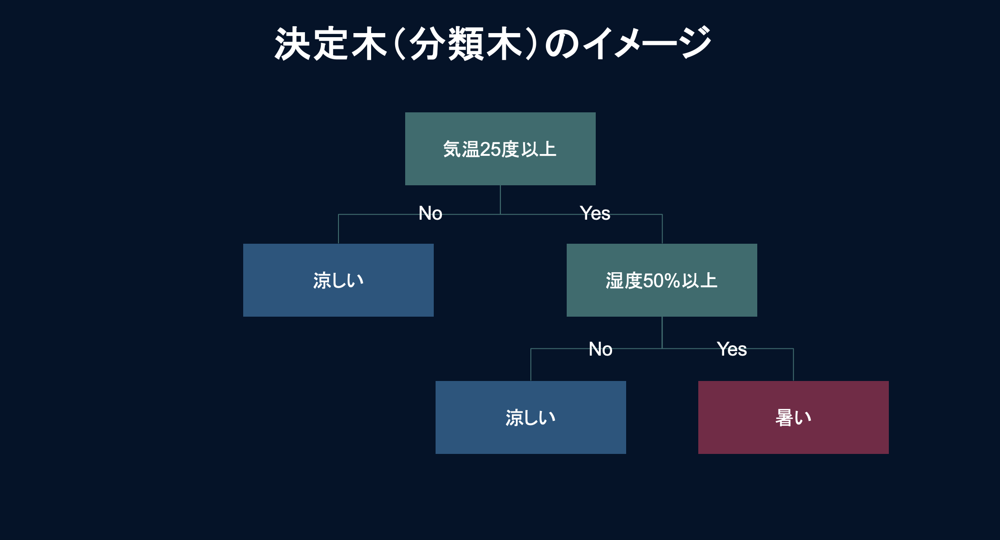

### <font color=#0e89b2>2)決定木の実装</font>

ここもせっかくなので、環状データを使って決定木モデルを実装してみましょう。<br>
ここでちょっと予想してみて欲しいです。<br>
<br>
環状データに対して決定木モデルで決定境界を描画すると、どのような形状になるでしょうか？

In [ ]:
#####写経#####
#k近傍法モデルを実装
from sklearn.datasets import make_circles
from sklearn.tree import DecisionTreeClassifier

#説明変数と目的変数のセット
x, y = make_circles(n_samples=200, noise=0.05)

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

#モデル構築
model = DecisionTreeClassifier()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  1.0
テストデータの正解率:  0.8166666666666667


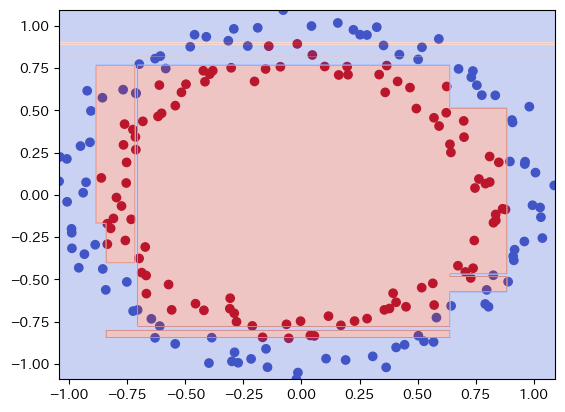

In [ ]:
#####写経#####
#決定境界を可視化
show_boundary(x, y, model)

### <font color=#0e89b2>3)決定木の分岐の可視化</font>

決定木のyes/noチャートを可視化することもできます。<br>
irisデータを使って可視化してみましょう。<br>

In [ ]:
#####写経#####
from sklearn import datasets
iris_data = datasets.load_iris()
iris = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)
iris['species'] = [iris_data.target_names[i] for i in iris_data.target]
iris = iris[(iris['species']=='versicolor') | (iris['species']=='virginica')].reset_index(drop=True)
iris.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),species
0,7.0,3.2,4.7,1.4,versicolor
1,6.4,3.2,4.5,1.5,versicolor
2,6.9,3.1,4.9,1.5,versicolor
3,5.5,2.3,4.0,1.3,versicolor
4,6.5,2.8,4.6,1.5,versicolor


今回はあまり分岐が複雑になってわけわからなくならにように、まずはmax_depthを1に設定してみましょう。

In [ ]:
#####写経#####
#ロジスティック回帰モデルの構築のためのライブラリをインポート
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

#説明変数のセット
x = iris.drop("species", axis=1)
#目的変数のセット
y = iris['species']
#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=0)

#モデル構築
model = DecisionTreeClassifier(max_depth=1) #max_depthの値を変えて実行してみてください
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  0.9571428571428572
テストデータの正解率:  0.8666666666666667


max_depth1でも、そこそこの精度が出ていますね。<br>
実際にどんな分岐で判定が行われているのかを可視化してみます。<br>
<br>
可視化は、これまたscikit-learn備えつけのplot_treeというライブラリを使えば簡単です。

[Text(0.5, 0.75, 'petal length (cm) <= 4.75\ngini = 0.5\nsamples = 70\nvalue = [35, 35]'),
 Text(0.25, 0.25, 'gini = 0.057\nsamples = 34\nvalue = [33, 1]'),
 Text(0.75, 0.25, 'gini = 0.105\nsamples = 36\nvalue = [2, 34]')]

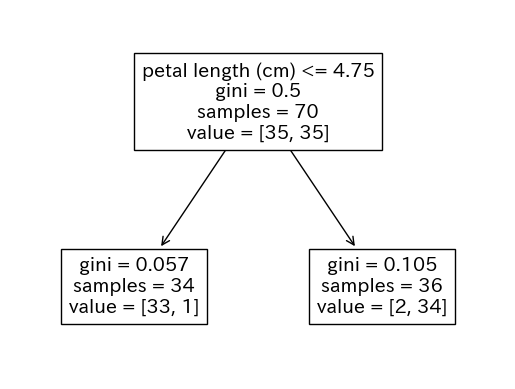

In [ ]:
#####写経#####
from sklearn.tree import plot_tree
plot_tree(model, feature_names=iris_data.feature_names)

これを見るとざっくりと、
* 花びらの長さが長いかどうかで分類ができること
* その閾値はおおよそ4.75cmであること
<br>

がわかりました。

## <font color=#0e89b2>3.5 ランダムフォレスト</font>

### <font color=#0e89b2>1)ランダムフォレストとは</font>

ランダムフォレストも回帰のパートですでに登場済ですが、一応復習しておきます。<br>
<br>
ランダムフォレストは、「フォレスト（森）」という名前の通り、複数の決定木を組み合わせる手法です。<br>
<font color=#f27405>複数の決定木を作ってそれぞれの木に予測を行わせ、最後に多数決を取って予測結果とする</font>ことで、精度を高めています。<br>
<br>
高い精度が出やすく、過学習も起きにくい強力なアルゴリズムですが、説明性が低いという欠点もあります。<br>
先ほどの決定木では決定境界が図示できていましたが、<br>
ランダムフォレストになると複数の決定木を作ってさらに多数決を取ってるわけなので、もはや図示できません。<br>
<br>
とはいえ、データが多次元になると、どのアルゴリズムを取ってもほぼ説明性はないようなものなので、<br>
（決定境界も図示できるのは三次元まで、さらに人間の頭で十分に理解できるのは二次元までですよね）<br>
精度が高いランダムフォレストが採用される機会は非常に多いです。

### <font color=#0e89b2>2)ランダムフォレストの実装</font>

乳がんデータで予測を行ってみます。<br>
まずデータを再確認します。

In [ ]:
from sklearn.datasets import load_breast_cancer
cancer_data = load_breast_cancer()
# 目的変数
exp_data = pd.DataFrame(cancer_data.data, columns=cancer_data.feature_names)
# 説明変数
tar_data = pd.DataFrame(cancer_data.target, columns=['target'])
# データを結合
cancer_data = pd.concat([exp_data, tar_data], axis=1)

cancer_data.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


ランダムフォレストのモデルを実装してみます。

In [ ]:
#####写経#####
from sklearn.ensemble import RandomForestClassifier

#説明変数と目的変数のセット
x = cancer_data.drop("target", axis=1)
y = cancer_data["target"]

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#モデル構築
model = RandomForestClassifier(max_depth=7)
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))

学習データの正解率:  0.9974874371859297
テストデータの正解率:  0.9707602339181286


さすがはランダムフォレスト、かなりの高精度を叩き出しています。

# <font color=#0e89b2>4. 総合問題1:NBA選手とNFL選手の分類</font>

同じアスリートでも、スポーツによって活躍しやすい体格は異なります。<br>
今回は簡単なモデルとして、身長と体重のデータからNBA選手とNFL選手を分類するモデルを作成してみましょう。

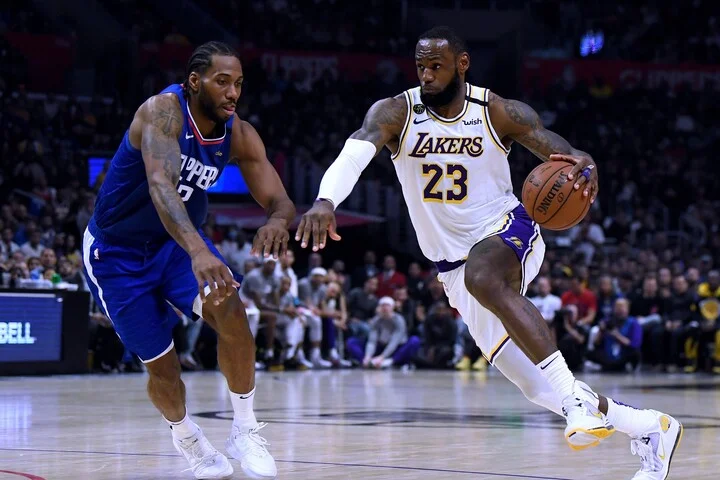

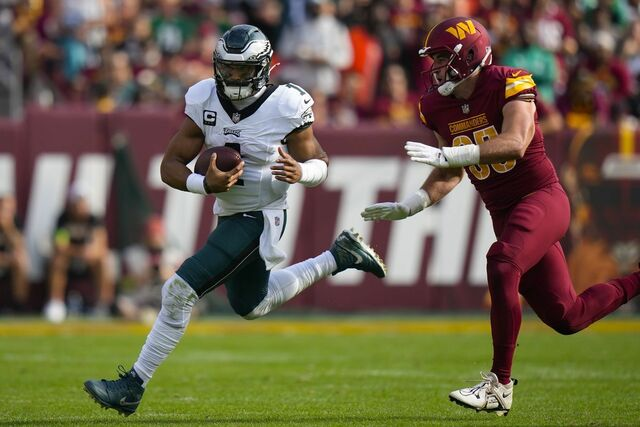

## <font color=#0e89b2>4.1 総合問題1-1:データの前処理</font>

2つのcsvデータ（NBA.csvとNFL.csv）を読み込み、<br>
scikit-learnの機械学習モデルに読み込ませられる形式に、データを整形してください。<br>
説明変数x（身長、体重）と目的変数y（ラベル）をデータフレーム形式でセットするところまでいきましょう。<br>
<br>
なお、この処理の際にはこの講座中で習わなかった方法も使うかもしれませんが、適宜ググってみて下さい。<br>
<br>
ファイルのリンクはこちらです。<br>
NBA.csv：https://drive.google.com/file/d/1hlLKmyx4fDIKrlzFX5Clzc6xHqiw9sSH/view?usp=drive_link<br>
NFL.csv：https://drive.google.com/file/d/1iynL-PGb3E2oqeYlcsYcOqe3t2yFIZ3P/view?usp=drive_link


解答

NBAデータとNFLデータをそれぞれ整形していきます。

In [ ]:
#NBAデータの確認
NBA= pd.read_csv("sample_data/NBA.csv", encoding="utf-8")
NBA.head()

,Unnamed: 0,選手名,背番号,チーム,ポジション,身長（cm）,体重（kg）,年齢,経験年数,国
0,NaN,AJ・ローソン,9.0,DAL,G,198.1,81.2,23,1,Canada
1,NaN,AJ・グリフィン,14.0,ATL,F,198.1,99.8,20,1,USA
2,NaN,AJ・グリーン,20.0,MIL,G,193.0,86.2,24,1,USA
3,NaN,EJ・リデル,32.0,NOP,F,198.1,108.9,23,0,USA
4,NaN,OG・アヌノビー,8.0,NYK,F-G,200.7,108.9,26,6,United Kingdom


In [ ]:
#NBAデータの整形
NBA.columns =  ["unnamed", "選手名", "背番号", "チーム", "ポジション", "身長", "体重", "年齢", "経験年数", "国"]
NBA["ラベル"] = "NBA"
NBA.head()

,unnamed,選手名,背番号,チーム,ポジション,身長,体重,年齢,経験年数,国,ラベル
0,NaN,AJ・ローソン,9.0,DAL,G,198.1,81.2,23,1,Canada,NBA
1,NaN,AJ・グリフィン,14.0,ATL,F,198.1,99.8,20,1,USA,NBA
2,NaN,AJ・グリーン,20.0,MIL,G,193.0,86.2,24,1,USA,NBA
3,NaN,EJ・リデル,32.0,NOP,F,198.1,108.9,23,0,USA,NBA
4,NaN,OG・アヌノビー,8.0,NYK,F-G,200.7,108.9,26,6,United Kingdom,NBA


In [ ]:
#NFLデータの確認
NFL= pd.read_csv("sample_data/NFL.csv", encoding="utf-8")
NFL.head()

,Unnamed: 0,Unnamed: 1,Unnamed: 2,Unnamed: 3,Unnamed: 4,Unnamed: 5,Unnamed: 6,Unnamed: 7
0,NaN,名前,背番号,ポジション,身長（cm）,体重（kg）,生年月日,ステータス
1,NaN,Daniel Arias,0,WR,191,98,1998-09-02,CUT
2,NaN,Andre Baccellia,0,WR,178,79,1997-01-07,DEV
3,NaN,Budda Baker,3,S,178,88,1996-01-10,ACT
4,NaN,Eric Banks,96,DE,196,124,1998-01-30,CUT


In [ ]:
#NFLデータの整形
NFL.columns =  ["unnamed", "選手名", "背番号", "ポジション", "身長", "体重", "生年月日", "ステータス"]
NFL["ラベル"] = "NFL"
NFL = NFL.drop(0)
NFL.head()

,unnamed,選手名,背番号,ポジション,身長,体重,生年月日,ステータス,ラベル
1,NaN,Daniel Arias,0,WR,191,98,1998-09-02,CUT,NFL
2,NaN,Andre Baccellia,0,WR,178,79,1997-01-07,DEV,NFL
3,NaN,Budda Baker,3,S,178,88,1996-01-10,ACT,NFL
4,NaN,Eric Banks,96,DE,196,124,1998-01-30,CUT,NFL
5,NaN,Krys Barnes,56,LB,188,104,1998-04-02,ACT,NFL


In [ ]:
NFL.dtypes

unnamed    float64
選手名         object
背番号         object
ポジション       object
身長          object
体重          object
生年月日        object
ステータス       object
ラベル         object
dtype: object

後ほどデータを可視化する時や機械学習モデルにかける際にエラーが出て気づくかもしれませんが、<br>
実はNFLデータの方の「身長」と「体重」が数値データではなくオブジェクトデータになっています。<br>
<br>
これは問題作成時に引っ掛け問題として狙って組み込んだわけではなく、ローデータがこの形式になっていたのです。<br>
データを扱う際には、度々こういうことが起こります。<br>
<br>
astypeメソッドを使って、数値データに変換しておきましょう。

In [ ]:
NFL = NFL.astype({"身長": float, "体重": float})
NFL.head()

,unnamed,選手名,背番号,ポジション,身長,体重,生年月日,ステータス,ラベル
1,NaN,Daniel Arias,0,WR,191.0,98.0,1998-09-02,CUT,NFL
2,NaN,Andre Baccellia,0,WR,178.0,79.0,1997-01-07,DEV,NFL
3,NaN,Budda Baker,3,S,178.0,88.0,1996-01-10,ACT,NFL
4,NaN,Eric Banks,96,DE,196.0,124.0,1998-01-30,CUT,NFL
5,NaN,Krys Barnes,56,LB,188.0,104.0,1998-04-02,ACT,NFL


In [ ]:
#NBAデータとNFLデータのマージ
sports = pd.concat([NBA[["選手名", "身長", "体重", "ラベル"]], NFL[["選手名", "身長", "体重", "ラベル"]]])
sports.head()

,選手名,身長,体重,ラベル
0,AJ・ローソン,198.1,81.2,NBA
1,AJ・グリフィン,198.1,99.8,NBA
2,AJ・グリーン,193.0,86.2,NBA
3,EJ・リデル,198.1,108.9,NBA
4,OG・アヌノビー,200.7,108.9,NBA


In [ ]:
#説明変数と目的変数のセット
x = sports[["身長", "体重"]]
y = sports["ラベル"]

## <font color=#0e89b2>4.2 総合問題1-2:データの可視化</font>

1-1で機械学習モデルを実装する準備は整いましたが、ちょっと立ち止まってデータの状況を確認してみましょう。<br>
<br>
縦軸に身長、横軸に体重をとって、散布図でデータを可視化して下さい。<br>
その際、ラベル（NBAまたはNFL）は点の色で分けましょう。<br>
凡例もつけておいてください。

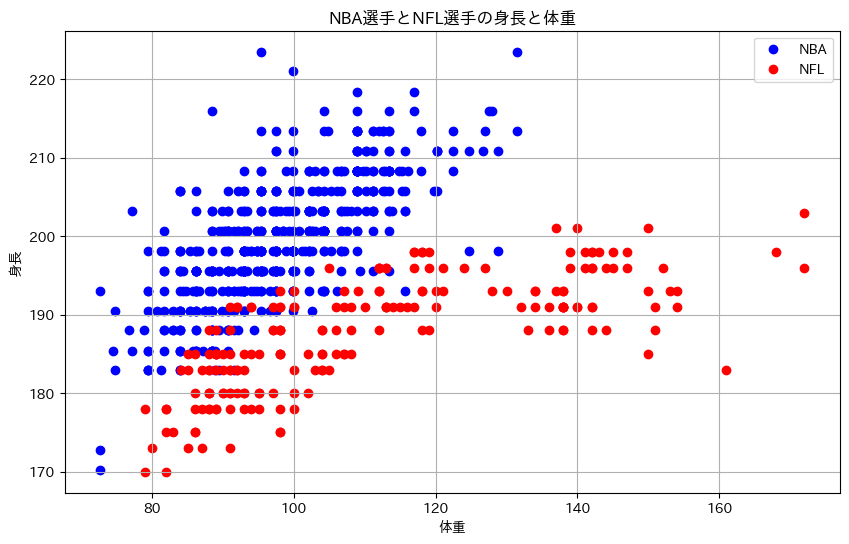

In [ ]:
#散布図の作成
#データの準備
NBA_weight = NBA["体重"]
NBA_height = NBA["身長"]
NFL_weight = NFL["体重"]
NFL_height = NFL["身長"]

#キャンバスの描画
plt.figure(figsize = (10,6)) #キャンパスの大きさの指定
plt.title("NBA選手とNFL選手の身長と体重") #グラフのタイトル
plt.xlabel("体重") #xの座標名
plt.ylabel("身長") #yの座標名
plt.grid(True) #グリッド線の表示

#グラフの描画
plt.scatter(NBA_weight, NBA_height, color="blue", label="NBA")
plt.scatter(NFL_weight, NFL_height, color="red", label="NFL")
plt.legend() #凡例を表示

plt.show()

こう見てみると、気持ち良いくらい綺麗に分布が分かれていることが分かります。<br>
当たり前ですが、やはりバスケ選手は比較的細身で、アメフト選手はがっちり目ですね。

## <font color=#0e89b2>4.3 総合問題1-3:モデルの作成</font>

身長と体重のデータから、NBA選手かNFL選手かを予測するモデルを作ります。<br>
これまで学んだ知識を使って、なるべく精度の高いモデルを作ってみて下さい。<br>
* 指標は正解率を使いましょう。
* 過学習にも注意するようにしてください。目安として、学習データとテストデータの正解率の差を3%以内に収めましょう。
* 学習データとテストデータは、7:3の比率で分割しましょう。

解答


◆ロジスティック回帰を使う場合

In [ ]:
#ロジスティック回帰モデルの構築のためのライブラリをインポート
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#モデル構築
model = LogisticRegression()

#学習
model.fit(x_train, y_train)

#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

学習データの正解率:  0.9409448818897638
テストデータの正解率:  0.9634703196347032
学習データとテストデータの正解率の差:  2.2525437744939425 %


◆サポートベクターマシンを使う場合

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
#データの標準化に必要なライブラリをインポート
from sklearn.preprocessing import StandardScaler

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#標準化
sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

#モデル構築
model = SVC()

#学習
model.fit(x_train_std, y_train)

#予測と評価
print("学習データの正解率: ", model.score(x_train_std, y_train))
print("テストデータの正解率: ", model.score(x_test_std, y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train_std, y_train) - model.score(x_test_std,y_test))*100, "%")

学習データの正解率:  0.9429133858267716
テストデータの正解率:  0.9634703196347032
学習データとテストデータの正解率の差:  2.0556933807931554 %


◆k近傍法を使う場合

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

#モデル構築
model = KNeighborsClassifier()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

学習データの正解率:  0.9547244094488189
テストデータの正解率:  0.958904109589041
学習データとテストデータの正解率の差:  0.41797001402221756 %


◆決定木を使う場合

In [ ]:
#ロジスティック回帰モデルの構築のためのライブラリをインポート
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state=0)

#モデル構築
model = DecisionTreeClassifier(max_depth=6)

#学習
model.fit(x_train, y_train)

#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

学習データの正解率:  0.9901574803149606
テストデータの正解率:  0.9634703196347032
学習データとテストデータの正解率の差:  2.668716068025745 %


◆ランダムフォレストを使う場合

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#モデル構築
model = RandomForestClassifier(max_depth=7)

#学習
model.fit(x_train, y_train)

#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

学習データの正解率:  0.9921259842519685
テストデータの正解率:  0.9680365296803652
学習データとテストデータの正解率の差:  2.4089454571603275 %


ランダムフォレストを使用した場合に最も精度が高く、かつ過学習が起きていないモデルを作成できていることがわかります。<br>
ここからは+αの内容です。

◆グリッドサーチで精度を上げてみる<br>
「機械学習基礎④機械学習上級者への道」で学習する内容ですが、<br>
④を終えてここに復習で戻ってきた時のために、コードを掲載しておきます。<br>
今の時点では飛ばして構いません。

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier

# パラメータの候補を設定
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7, 10]
}

# GridSearchCVのインスタンスを作成
grid_search = GridSearchCV(RandomForestClassifier(random_state=0), param_grid, cv=5)

# ハイパーパラメータ探索を実行
grid_search.fit(x_train, y_train)

# 最適なパラメータでモデルを作成
model = grid_search.best_estimator_

# 最適なパラメータを表示
print("最適なパラメータ: ", grid_search.best_params_)

# 予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test, y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

最適なパラメータ:  {'max_depth': 10, 'n_estimators': 50}
学習データの正解率:  1.0
テストデータの正解率:  0.9726027397260274
学習データとテストデータの正解率の差:  2.73972602739726 %


◆学習曲線を用いて過学習を判断する

ここも飛ばして構いません。興味のある方は復習の時に調べてみましょう。

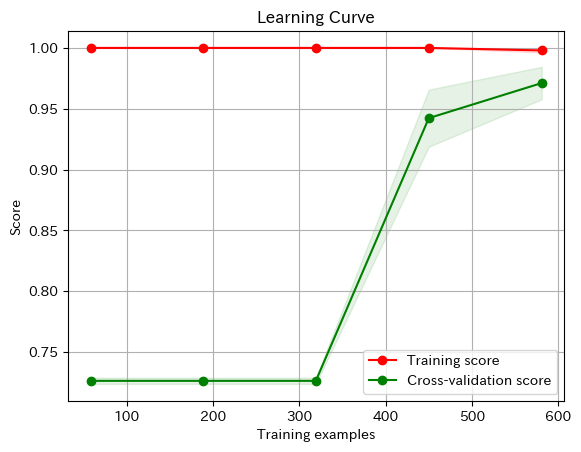

In [ ]:
import matplotlib.pyplot as plt
from sklearn.model_selection import learning_curve

# 学習曲線の計算
train_sizes, train_scores, test_scores = learning_curve(model, x, y, cv=5)

# 平均スコアと標準偏差の計算
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
test_scores_mean = np.mean(test_scores, axis=1)
test_scores_std = np.std(test_scores, axis=1)

# 学習曲線のプロット
plt.figure()
plt.title("Learning Curve")
plt.xlabel("Training examples")
plt.ylabel("Score")

plt.grid()

plt.fill_between(train_sizes, train_scores_mean - train_scores_std,
                 train_scores_mean + train_scores_std, alpha=0.1, color="r")
plt.fill_between(train_sizes, test_scores_mean - test_scores_std,
                 test_scores_mean + test_scores_std, alpha=0.1, color="g")

plt.plot(train_sizes, train_scores_mean, 'o-', color="r", label="Training score")
plt.plot(train_sizes, test_scores_mean, 'o-', color="g", label="Cross-validation score")

plt.legend(loc="best")

plt.show()

学習曲線を用いて過学習を判断する一般的な方法は以下の通りです：

---

* 学習データのスコア（赤線）と交差検証スコア（緑線）が離れている場合：
 * 過学習（overfitting）の典型的な兆候です。
 * モデルが学習データに対して高い精度を達成している一方で、新しいデータ（ここでは交差検証データ）に対する精度が低いという状況を示しています。

* 学習データのスコアと交差検証スコアが近い場合：
 * モデルが適切に学習できていることを示しています。

* 学習データのスコアと交差検証スコアが低い場合:
 * これは未学習（underfitting）の兆候です。モデルが学習データに対しても新しいデータに対しても適切に予測できていない状況を示しています。

---



## <font color=#0e89b2>4.4 総合問題1-4:変数の追加</font>

モデルに説明変数として「年齢」も追加した場合に、<br>
モデルの精度は上がるでしょうか、それほど変わらないでしょうか、むしろ下がるでしょうか。<br>
実際にモデルを実装して確かめてみてください。<br>
<br>
ヒント：<br>
日付の計算は、datetimeライブラリを使うと便利です。<br>
例）<br>
to_datetime()：日時を表す文字列をdatetime型に変換<br>
TImestamp("now")：現在の日付を取得

解答

年齢を追加した説明変数を用意する

In [ ]:
#CSV読み込み
NBA= pd.read_csv("sample_data/NBA.csv", encoding="utf-8")
#NBAデータを整形
NBA.columns =  ["unnamed", "選手名", "背番号", "チーム", "ポジション", "身長", "体重", "年齢", "経験年数", "国"]
NBA["ラベル"] = "NBA"

#CSV読み込み
NFL= pd.read_csv("sample_data/NFL.csv", encoding="utf-8")
#NFLデータの整形
NFL.columns =  ["unnamed", "選手名", "背番号", "ポジション", "身長", "体重", "生年月日", "ステータス"]
NFL["ラベル"] = "NFL"
NFL = NFL.drop(0)

生年月日を年齢に変更

In [ ]:
import pandas as pd
from datetime import datetime

#生年月日をdatetime型に変換
NFL['生年月日'] = pd.to_datetime(NFL['生年月日'])

#現在の日付を取得
now = pd.Timestamp('now')

#年齢を計算
NFL['年齢'] = (now - NFL['生年月日']).astype('<m8[Y]')
#11行目がバージョンの問題で動かない場合はこちら
#NFL['年齢'] = (now - NFL['生年月日']).dt.days//365

NFL.head()

,unnamed,選手名,背番号,ポジション,身長,体重,生年月日,ステータス,ラベル,年齢
1,NaN,Daniel Arias,0,WR,191,98,1998-09-02,CUT,NFL,25.0
2,NaN,Andre Baccellia,0,WR,178,79,1997-01-07,DEV,NFL,27.0
3,NaN,Budda Baker,3,S,178,88,1996-01-10,ACT,NFL,28.0
4,NaN,Eric Banks,96,DE,196,124,1998-01-30,CUT,NFL,25.0
5,NaN,Krys Barnes,56,LB,188,104,1998-04-02,ACT,NFL,25.0


In [ ]:
#データ型を整形
NFL = NFL.astype({"身長": float, "体重": float, "年齢": int})
NFL.dtypes

unnamed           float64
選手名                object
背番号                object
ポジション              object
身長                float64
体重                float64
生年月日       datetime64[ns]
ステータス              object
ラベル                object
年齢                  int64
dtype: object

In [ ]:
#NBAデータとNFLデータのマージ
sports = pd.concat([NBA[["選手名", "身長", "体重", "年齢", "ラベル"]], NFL[["選手名", "身長", "体重", "年齢", "ラベル"]]])
sports.head()

,選手名,身長,体重,年齢,ラベル
0,AJ・ローソン,198.1,81.2,23,NBA
1,AJ・グリフィン,198.1,99.8,20,NBA
2,AJ・グリーン,193.0,86.2,24,NBA
3,EJ・リデル,198.1,108.9,23,NBA
4,OG・アヌノビー,200.7,108.9,26,NBA


In [ ]:
#説明変数と目的変数のセット
x = sports[["身長", "体重", "年齢"]]
y = sports["ラベル"]

モデルの学習

サポートベクターマシーン

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import train_test_split
#データの標準化に必要なライブラリをインポート
from sklearn.preprocessing import StandardScaler

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#標準化
sc = StandardScaler()
sc.fit(x_train)
x_train_std = sc.transform(x_train)
x_test_std = sc.transform(x_test)

#モデル構築
model = SVC()

#学習
model.fit(x_train_std, y_train)

#予測と評価
print("学習データの正解率: ", model.score(x_train_std, y_train))
print("テストデータの正解率: ", model.score(x_test_std, y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train_std, y_train) - model.score(x_test_std,y_test))*100, "%")

学習データの正解率:  0.9547244094488189
テストデータの正解率:  0.9452054794520548
学習データとテストデータの正解率の差:  0.951892999676407 %


k近傍法

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=0)

#モデル構築
model = KNeighborsClassifier()
#学習
model.fit(x_train, y_train)
#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

学習データの正解率:  0.9488188976377953
テストデータの正解率:  0.9452054794520548
学習データとテストデータの正解率の差:  0.3613418185740458 %


ランダムフォレスト

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

#説明変数xと目的変数yはセット済み

#訓練データとテストデータに分割 (今回は7：3の割合で分割する)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

#モデル構築
model = RandomForestClassifier(max_depth=7)

#学習
model.fit(x_train, y_train)

#予測と評価
print("学習データの正解率: ", model.score(x_train, y_train))
print("テストデータの正解率: ", model.score(x_test,y_test))
print("学習データとテストデータの正解率の差: ",abs(model.score(x_train, y_train) - model.score(x_test,y_test))*100, "%")

学習データの正解率:  0.984251968503937
テストデータの正解率:  0.958904109589041
学習データとテストデータの正解率の差:  2.5347858914895993 %


いくつかの学習モデルを使用して正解率を確認しましたが、<br>
年齢がない時と比べて、少しだけ精度が低くなってしまっています。<br>
このように、不要な変数は削ぎ落とした方がモデルの精度が上がることがあります。<br>
<br>
参考までに、年齢のデータをSeabornを使って可視化してみます。

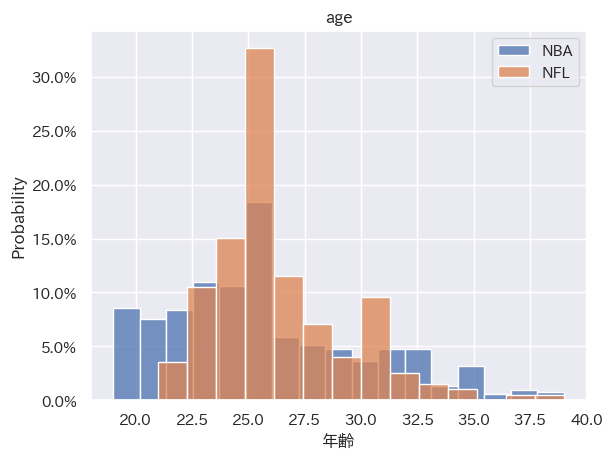

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick
import japanize_matplotlib

#seabornに日本語を適用
sns.set(font='IPAexGothic')

#ヒストグラムを作成
ax = sns.histplot(NBA["年齢"], label="NBA", stat="probability") #stat="probability"を指定すると、バーの高さの合計が1になるように正規化されます
sns.histplot(NFL["年齢"], label="NFL", stat="probability", ax=ax)

#y軸の単位をパーセントに変更
ax.yaxis.set_major_formatter(mtick.PercentFormatter(1.0))

#グラフのタイトルを設定
plt.title('age')
plt.legend()

#グラフを表示
plt.show()

分布の形状は異なっており、ぱっと見有効な特徴量になりそうですが、<br>
今回は上手く機能しなかったようです。

# <font color=#0e89b2>5. 総合問題2:自動車の適正価格予測</font>

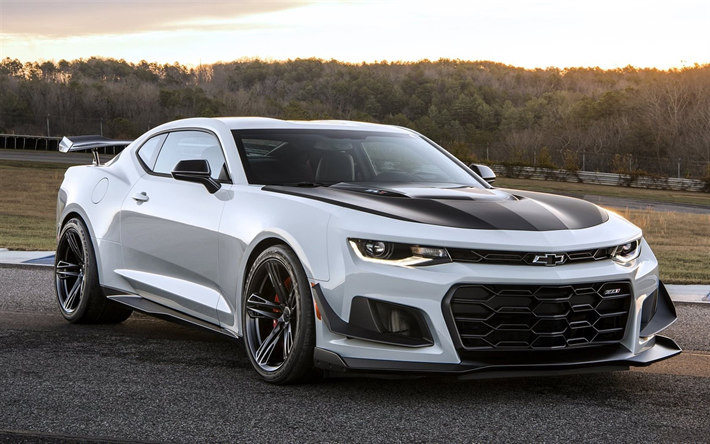

ボディサイズや馬力、燃費などから<font color=#f27405>自動車の適正価格を予測</font>してみましょう。<br>
<br>
とある自動車メーカーXのプロジェクトに、あなたはデータサイエンティストとしてアサインされました。<br>
プロジェクトの背景と検討内容は以下の通りです。
<br>
◆背景
* 自動車メーカーXは、これまで<font color=#f27405>大衆向けのリーズナブルな車を製造</font>してきました。
* しかしXの車は、そのブランドステータスの低さから<font color=#f27405>中古車市場で大きな値崩れ</font>を起こしています。（中古車ディーラーが買いたがらず、さらに買取価格が下がる負のスパイラル）
* さらにそのリセールバリュー（中古で売った時の価格）の低さから、<font color=#f27405>新車の売れ行きも大幅に悪化</font>しまいました。
* そこでXは、これまでの大衆向けのブランディング戦略を見直し、<font color=#f27405>ハイクラス帯の車種もリリース</font>していくことを検討しています。

◆検討内容
*   とはいえ、これまで大衆車メーカーとして認知されてきたXですから、いきなり高価格で新車を販売しても売れないでしょう。
*   一方カースペックに対してあまり価格を抑えすぎても、利益が出ないもはもちろんですし、また「ハイクラス」としてのブランドステータスも確立できず、「脱大衆車」の目的を実現できません。
* そこで、現在の車市場ではどのくらいのカースペックであればどのくらいの価格が適正なのかを、競合自動車メーカーのデータをもとに算定するモデルを作りたいと考えています。



様々な自動車メーカーの車種のカースペックと価格がまとめられたデータがこちらです。<br>
https://drive.google.com/file/d/1jfMz1tNBrAD64jjnrluXPUVfFAk0JOmc/view?usp=drive_link

なお、各特徴量の意味は下記のとおりです。<br>
<br>


---
* Car_ID：ID
* Symboling：安全性（-3は安全性が高く、+3は低い）
* carCompany：自動車メーカー名
* fueltype：燃料タイプ（ガソリンorディーゼル）
* aspiration：ターボ車or非ターボ車
* doornumber：ドア数
* carbody：形状タイプ（セダン、ワゴンなど）
* drivewheel：駆動方式（2輪or4輪）
* enginelocation：エンジン設置場所
* wheelbase：ホイールベース長
* carlength：車長
* carwidth：車幅
* carheight：車高
* curbweight：車重
* enginetype：エンジンタイプ(dohc、rotorなど。それぞれエンジンの特徴が異なる）
* cylindernumber：気筒数（一般に、多いほど最高速度が上がるが、低速での加速性能や燃費は悪くなる）
* enginesyze：エンジンのサイズ
* fuelsystem：燃料システム
* boreratio：ストローク長と気筒直径の比率
* stroke：ストローク（スペンションやエンジンのピストンが上下方向に動く行程距離）
* compressionratio：圧縮比（一般に、高いほどエンジンパワーが向上する）
* horsepower：馬力
* peakrpm：最高エンジン回転数
* citympg：市街地での燃費
* highwaympg：高速道路での燃費
* price：車の価格

---



## <font color=#0e89b2>5.1 総合問題2-1:モデルの作成</font>

データファイルに含まれている特徴量から自動車の価格を予測するモデルを作成してください。
* "CarName"のカラムは現時点では使用しなくて大丈夫です。

解答

まずはデータの前処理を行っていきます。

In [ ]:
#データのロード
car = pd.read_csv("sample_data/carprice.csv", encoding="utf-8")
car.head()

,car_ID,symboling,CarName,fueltype,aspiration,doornumber,carbody,drivewheel,enginelocation,wheelbase,...,enginesize,fuelsystem,boreratio,stroke,compressionratio,horsepower,peakrpm,citympg,highwaympg,price
0,1,3,alfa-romero giulia,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,13495.0
1,2,3,alfa-romero stelvio,gas,std,two,convertible,rwd,front,88.6,...,130,mpfi,3.47,2.68,9.0,111,5000,21,27,16500.0
2,3,1,alfa-romero Quadrifoglio,gas,std,two,hatchback,rwd,front,94.5,...,152,mpfi,2.68,3.47,9.0,154,5000,19,26,16500.0
3,4,2,audi 100 ls,gas,std,four,sedan,fwd,front,99.8,...,109,mpfi,3.19,3.40,10.0,102,5500,24,30,13950.0
4,5,2,audi 100ls,gas,std,four,sedan,4wd,front,99.4,...,136,mpfi,3.19,3.40,8.0,115,5500,18,22,17450.0


ダミー変数化を行います。

In [ ]:
#質的変数のカラムをダミー変数化
car = pd.get_dummies(car, columns=["fueltype", "doornumber", "symboling", "aspiration", "carbody", "drivewheel", "enginelocation", "enginetype", "cylindernumber", "fuelsystem"])
car.head()

,car_ID,CarName,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,...,cylindernumber_twelve,cylindernumber_two,fuelsystem_1bbl,fuelsystem_2bbl,fuelsystem_4bbl,fuelsystem_idi,fuelsystem_mfi,fuelsystem_mpfi,fuelsystem_spdi,fuelsystem_spfi
0,1,alfa-romero giulia,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,...,0,0,0,0,0,0,0,1,0,0
1,2,alfa-romero stelvio,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,...,0,0,0,0,0,0,0,1,0,0
2,3,alfa-romero Quadrifoglio,94.5,171.2,65.5,52.4,2823,152,2.68,3.47,...,0,0,0,0,0,0,0,1,0,0
3,4,audi 100 ls,99.8,176.6,66.2,54.3,2337,109,3.19,3.40,...,0,0,0,0,0,0,0,1,0,0
4,5,audi 100ls,99.4,176.6,66.4,54.3,2824,136,3.19,3.40,...,0,0,0,0,0,0,0,1,0,0


モデルを構築していきます。<br>
ここではランダムフォレストを使用します。<br>
今回はより厳密にモデルの精度を評価するため、10回分のスコアの平均値を取ってみましょう。<br>
<br>
またこの機会に、便利ツール"tqdm"の使い方もマスターしておきましょう。<br>
tqdmを使うと、コードの実行進捗をバーで表示することができます。

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from tqdm import tqdm

#説明変数xと目的変数yをセット
x = car.drop(["car_ID", "CarName", "price"], axis=1)
y = car["price"]

#スコア保管用のリストを用意
train_score_ls = []
test_score_ls = []
for i in tqdm(range(10)):
  #訓練データとテストデータに分割 (今回は7：3の割合で分割)
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3)
  #モデル構築
  model = RandomForestRegressor()
  #学習
  model.fit(x_train, y_train)
  #スコアを算出
  train_score_ls.append(model.score(x_train, y_train))
  test_score_ls.append(model.score(x_test,y_test))

#評価
print("\n")
print("学習データの決定係数(10回分の平均値): ", np.mean(train_score_ls))
print("テストデータの決定係数(10回分の平均値): ", np.mean(test_score_ls))

100%|██████████| 10/10 [00:05<00:00,  1.69it/s]



学習データの決定係数(10回分の平均値):  0.9875778358205389
テストデータの決定係数(10回分の平均値):  0.917527202895258


## <font color=#0e89b2>5.2 総合問題2-2:変数の追加</font>

### <font color=#0e89b2>(1) 自動車メーカーカラムの作成</font>

総合問題2-1で使わなかったカラム`CarName`を見てみると<br>
社名/空白/モデル名  <br>
の形式になっていることがわかります。  <br>
ここから社名を抜き出して、新しく「社名」という特徴量を作れば、さらにモデルの精度が向上できるかもしれません。<br>
まずは、「社名」という新しいカラムを作成してみてください。<br>
<br>
ヒント：<br>
* split関数を使いましょう。
* 表記ブレはしていませんか？

解答

In [ ]:
car = pd.read_csv("sample_data/carprice.csv", encoding="utf-8")
car = pd.get_dummies(car, columns=["fueltype", "doornumber", "symboling", "aspiration", "carbody", "drivewheel", "enginelocation", "enginetype", "cylindernumber", "fuelsystem"])
car.head()

,car_ID,CarName,wheelbase,carlength,carwidth,carheight,curbweight,enginesize,boreratio,stroke,...,cylindernumber_twelve,cylindernumber_two,fuelsystem_1bbl,fuelsystem_2bbl,fuelsystem_4bbl,fuelsystem_idi,fuelsystem_mfi,fuelsystem_mpfi,fuelsystem_spdi,fuelsystem_spfi
0,1,alfa-romero giulia,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,...,0,0,0,0,0,0,0,1,0,0
1,2,alfa-romero stelvio,88.6,168.8,64.1,48.8,2548,130,3.47,2.68,...,0,0,0,0,0,0,0,1,0,0
2,3,alfa-romero Quadrifoglio,94.5,171.2,65.5,52.4,2823,152,2.68,3.47,...,0,0,0,0,0,0,0,1,0,0
3,4,audi 100 ls,99.8,176.6,66.2,54.3,2337,109,3.19,3.40,...,0,0,0,0,0,0,0,1,0,0
4,5,audi 100ls,99.4,176.6,66.4,54.3,2824,136,3.19,3.40,...,0,0,0,0,0,0,0,1,0,0


まずは各メーカーごとのデータ数を確認してみます。

In [ ]:
company_name_ls = []
for i in car["CarName"]:
  company_name = list(i.split(" "))[0]
  company_name_ls.append(company_name)
car["company"] = company_name_ls
car["company"].value_counts()

toyota         31
nissan         17
mazda          15
honda          13
mitsubishi     13
subaru         12
peugeot        11
volvo          11
volkswagen      9
dodge           9
buick           8
bmw             8
audi            7
plymouth        7
saab            6
isuzu           4
porsche         4
alfa-romero     3
chevrolet       3
jaguar          3
vw              2
maxda           2
renault         2
toyouta         1
vokswagen       1
Nissan          1
mercury         1
porcshce        1
Name: company, dtype: int64

これを見ると、"maxda", "toyouta"などの表記ミスが発生していることがわかります。<br>
これをクリーニングしていきましょう。<br>
こういう時は、replace関数を使います。

In [ ]:
#誤表記を正しい表記に変換
car = car.replace({"maxda": "mazda", "toyouta": "toyota", "Nissan": "nissan", "vokswagen": "volkswagen", "vw": "volkswagen"})

#自動車メーカーごとのデータ数を集計
car["company"].value_counts()

toyota         32
nissan         18
mazda          17
mitsubishi     13
honda          13
volkswagen     12
subaru         12
peugeot        11
volvo          11
dodge           9
buick           8
bmw             8
audi            7
plymouth        7
saab            6
isuzu           4
porsche         4
jaguar          3
chevrolet       3
alfa-romero     3
renault         2
mercury         1
porcshce        1
Name: company, dtype: int64

### <font color=#0e89b2>(2) 自動車メーカーによる価格帯の差の可視化</font>

各自動車メーカーの自動車の価格を、箱ひげ図で可視化してください。<br>
横比較しやすいように、一つのキャンバス内に横並びで表示してみましょう。<br>
<br>
ヒント：<br>
seabornを使います。

解答

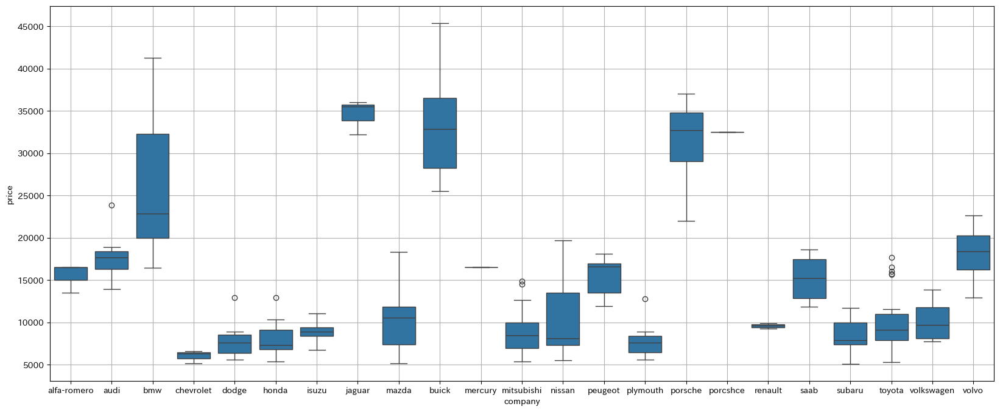

In [ ]:
#箱ひげ図の作成
plt.figure(figsize=(20, 8))
sns.boxplot(x='company', y='price', data=car)
plt.grid()
plt.show()

### <font color=#0e89b2>(3) モデルの作成</font>

改めてモデルを作成して、スコアを確認してみてください。

解答

メーカー名カラムをダミー変数化しておきます。

In [ ]:
car = pd.get_dummies(car, columns=["company"])

モデルを実装します。<br>
先ほど同様、10回分実行した平均値を取ってみます。

In [ ]:
from sklearn.ensemble import RandomForestRegressor

#説明変数xと目的変数yをセット
x = car.drop(["CarName", "price"], axis=1)
y = car["price"]

#スコア保管用のリストを用意
train_score_ls = []
test_score_ls = []
for i in tqdm(range(10)):
  #訓練データとテストデータに分割 (今回は7：3の割合で分割)
  x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3)
  #モデル構築
  model = RandomForestRegressor()
  #学習
  model.fit(x_train, y_train)
  #スコアを算出
  train_score_ls.append(model.score(x_train, y_train))
  test_score_ls.append(model.score(x_test,y_test))

#評価
print("\n")
print("学習データの決定係数(10回分の平均値): ", np.mean(train_score_ls))
print("テストデータの決定係数(10回分の平均値): ", np.mean(test_score_ls))

100%|██████████| 10/10 [00:04<00:00,  2.03it/s]



学習データの決定係数(10回分の平均値):  0.9888328222413983
テストデータの決定係数(10回分の平均値):  0.9279605521983179


元々決定係数0.9超えのハイスコアを叩き出していましたが、<br>
自動車メーカー名をカラムとして追加することで、さらに精度を向上することができました。